#  Introduction to Retrieval Augmentation Generation (RAG)

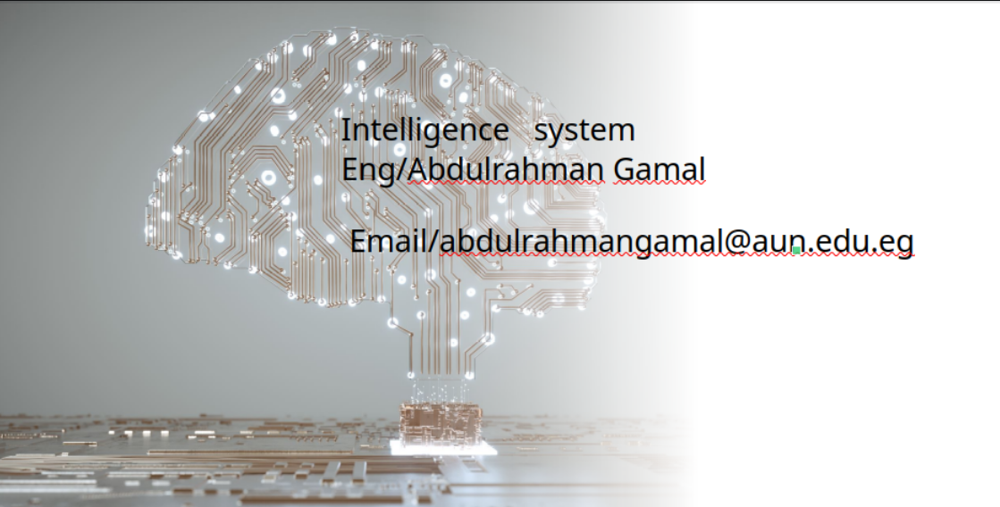

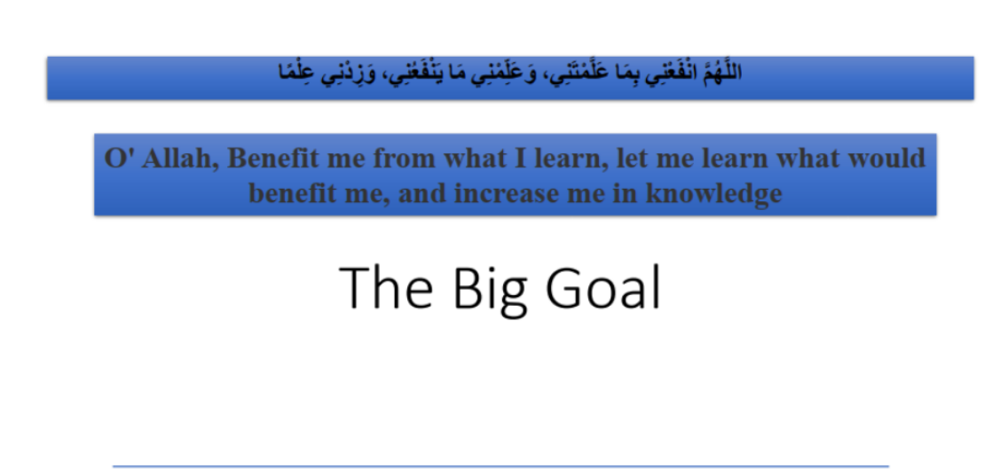

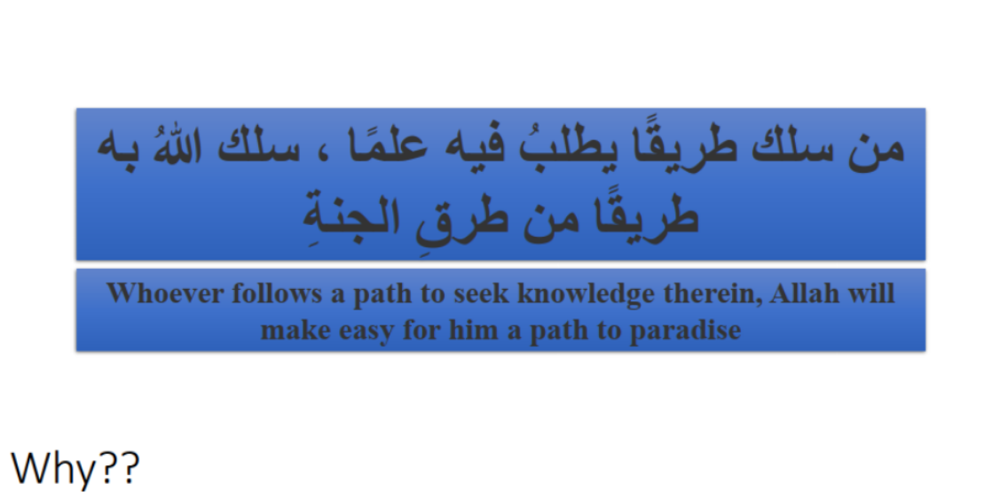

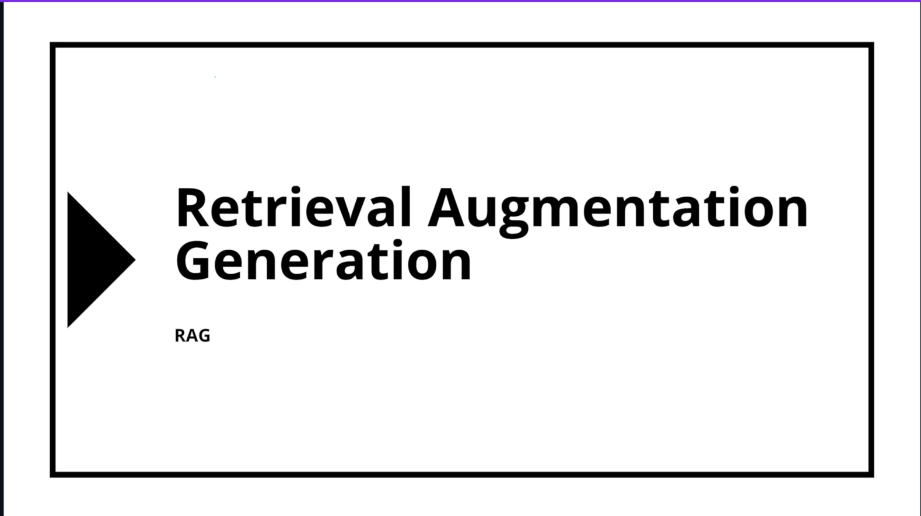


In this section, we'll dive into the technique which is called retrieval augmentation generation,


# use case 

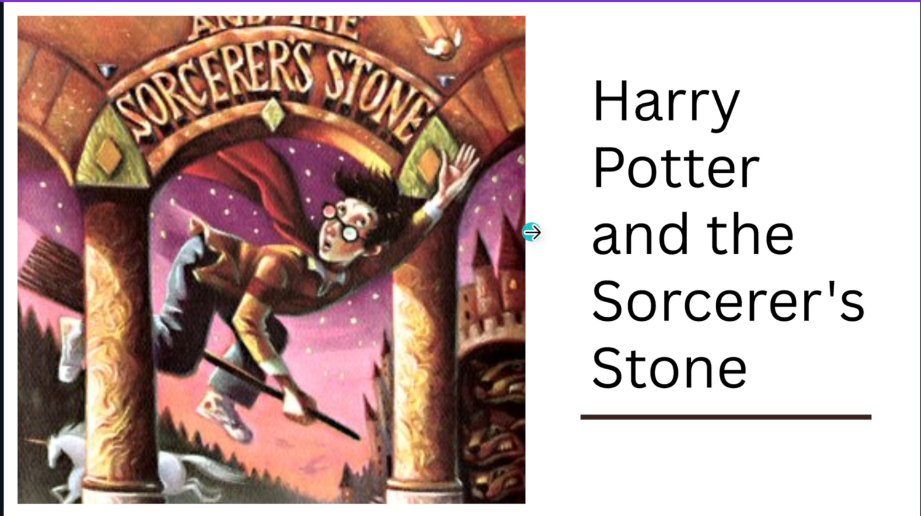


So let's take the use case that we have a very large document.          
And this document has tons of information inside it.So it may be maybe hundreds of pages.        

And in this example I took the book Harry Potter and the Sorcerer's Stone, which is a pretty long book.      

Now, we might want to ask the LLM questions on this book, and specifically maybe questions focused        
on different areas in the book, or maybe specific scenes, maybe specific paragraphs.           

So questions, for example, like how to make a certain type of potion where the answer resides in a      
very particular paragraph.         


And this problem is especially important when we're dealing with `private data,` because large language       
models are not trained on these private data, so they are not aware of it.         
 
So because our financial document is private, the LLM doesn't really know anything about it.      
So we need to find a way for the LLM to effectively question answer over this document.      




#  Naive Solution 
Now a very naive solution is going to take the entire book.Let's say it's a PDF document.

And to simply go and plug everything into our prompt that we sent LN.
So we're going to stuff the LM with the entire book and we are going to ask the question.

Now this solution might work some of the times, but it has a lot of problems with it and it doesn't really scale.

There is an inherent hard limit of how much text we can feed the LM, so if the document is going to

be too long and if this book is going to be too long, we're not going to be able to fit everything
because we're going to exceed the LMS token limits.




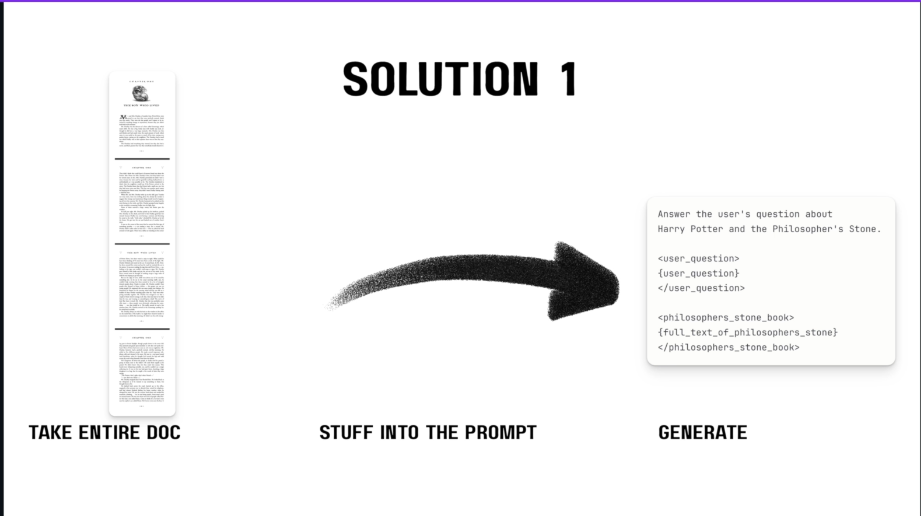




And even if we have LMS with 1 million or 2 million token limit, which is quite common these days,

this solution is still not ideal.`It has many other disadvantages.`

For example, the LM is going to be much `less effective `with very long prompts and very long context.
And these have been proven in research.


There is also the `issue for cost,` because larger prompts are going to cost us more, and there is a

`latency `issue because larger prompts are going to take longer to process.

### summery  of disadvantages

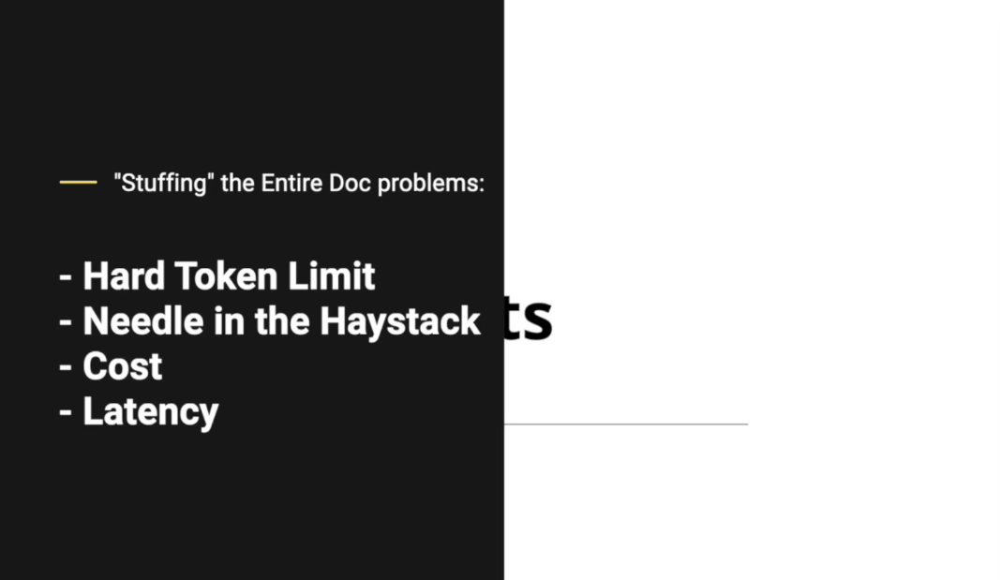


# Second solution

So the second solution is going to require us to add some pre-processing.
And it's going to require us to take the original document.
And doesn't matter how long it is, we're going to be splitting it into smaller chunks.
 Now these chunking process can be naive and it can also be complex.
We have a long range of how to do it.


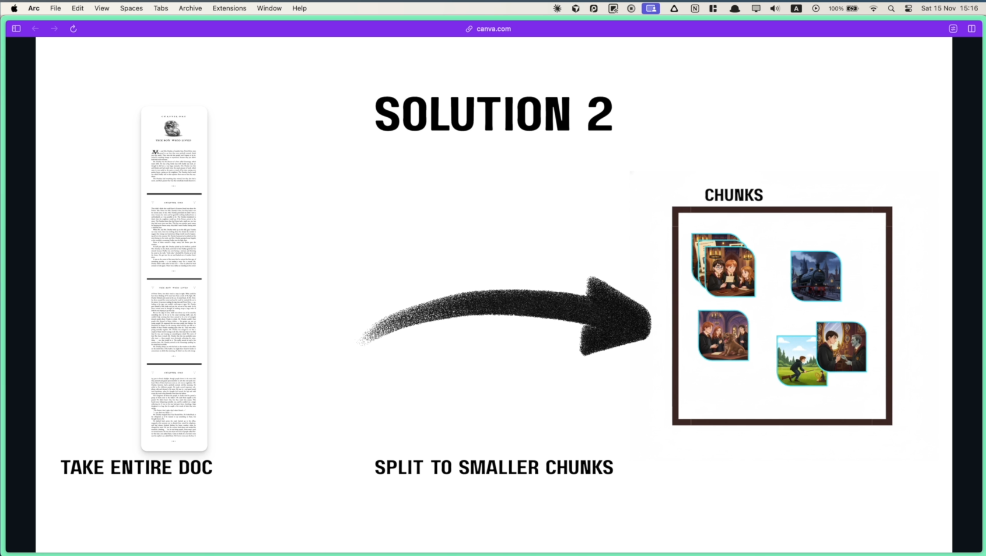

So let's assume now that we have those chunks now ready.
Now in the second solution, instead of plugging in the entire book, we're going to add another step,

which is going to take the user's query, and it's going to find the most relevant chunk for that query.
We're going to plug to the LM call only that relevant chunk, which is the most relevant to the question


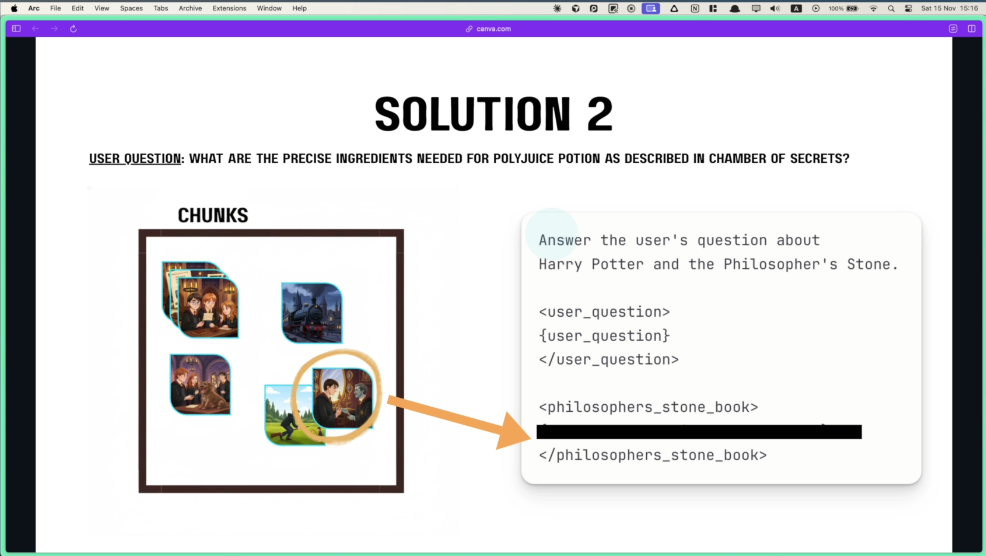



So now we are focusing the large language model to answer and to ground the answer only on something
which is the relevant piece of data that is going to answer the question.

So the LLM is going to have a much easier time of answering our question.

So instead of sending the entire book, we are going to send only a specific paragraph or only a couple
of paragraphs here.


And we are going to solve all of the problems we talked about.

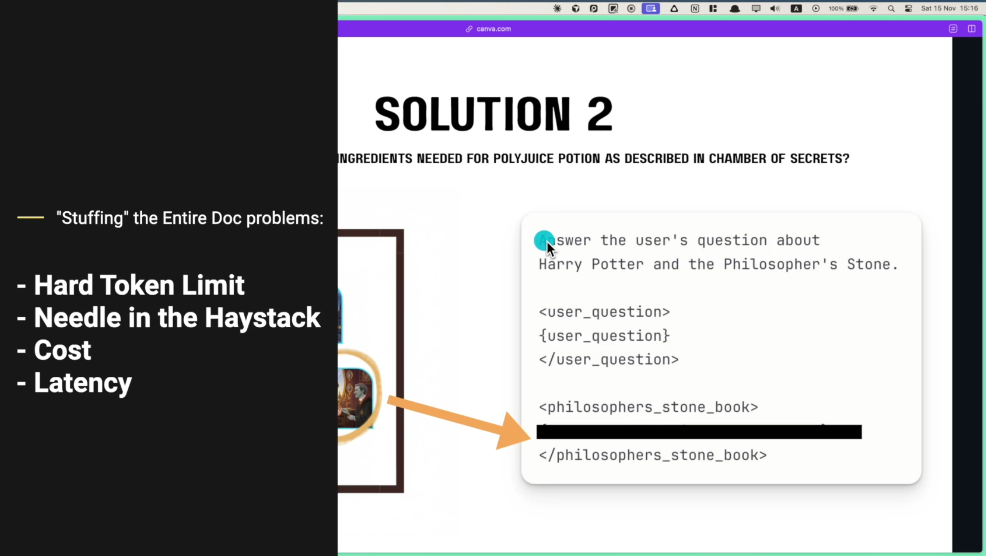


We are not going to pass the hard token limit of the LLM because we are sending much smaller piece of              
We won't encounter the needle in the haystack problem because we are only sending very, very specific        

We won't encounter the needle in the haystack problem because we are only sending very, very specific    

pieces of text which are the most relevant for the question going to cost less because we're sending     
fewer tokens to the large language model.       

And of course, the processing time of the LLM is going to be faster because it's going to process less         

This technique can scale to very large documents, and it can even work with multiple documents here.        

This technique can scale to very large documents, and it can even work with multiple documents here.            
Now, it does have its drawbacks.      

So it's going to require us to add a pre-processing step to chunk the large documents.

### There is a lot of depth into this chunking mechanism.   

How do we chunk the document?         

What are going to be the tokens that we split the documents from?       

`How are we going to make sure that each chunk is going to have the relevant data?`

And what if we're dealing not with the document but with a code repository?         
We need different chunking strategies to different type of documents.           

And what if we do not know what is the content of the document.       
And we get it dynamically for the user.     

So there is a lot of depth in this pre-processing part. 


## ` Now another downside  `

Now another downside is that we need to have some kind of searching mechanism to find those relevant chunk  

And what if those relevant chunks are not that relevant, and we need additional context to send to   
the LM to answer the user's query.      


# RAG 

And by the way solution number two that we discussed this is actually rack retrieval augmentation generation.
It was a very high level overview of rack.


Now in rack retrieval is for retrieving the relevant chunks.

Augmentation means that we take our prompt and we augment it with those relevant chunks.

And generation means to simply send to the LM and to use that when we make the query to the LM.

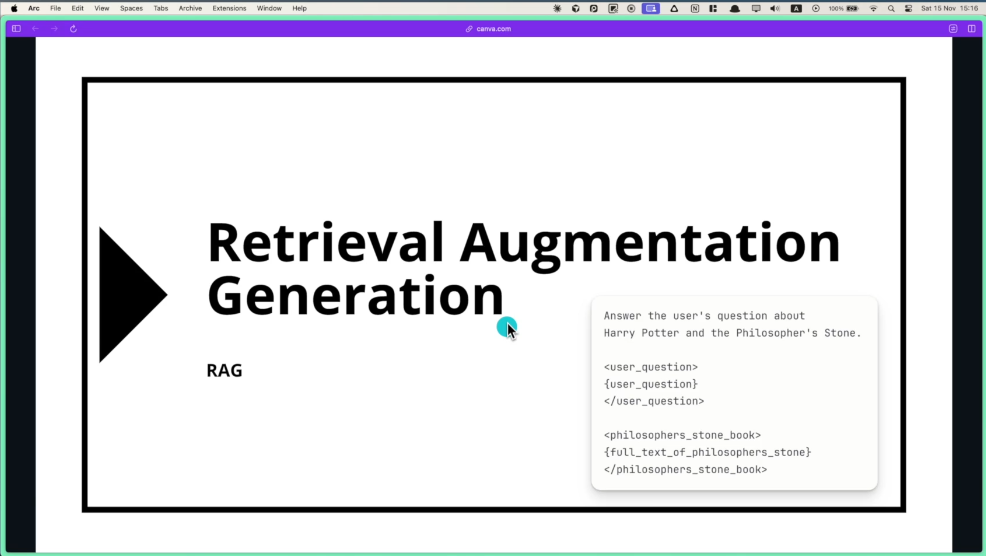



# we cover 

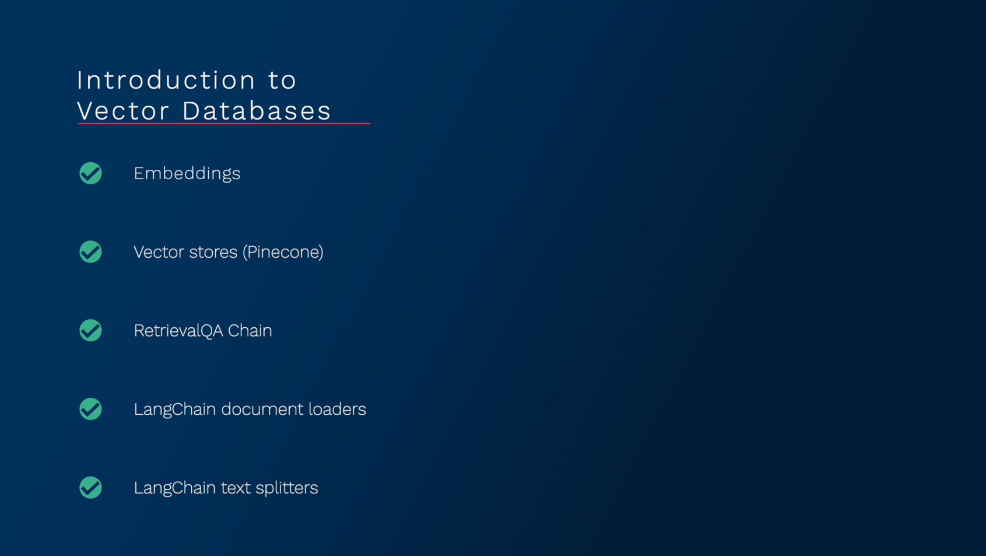


## documents

Now remember in the introduction section we discussed that long chain is super powerful because it helps      
us interact with a lot of third parties.      

You can connect your Google Drive and read documents.         
You can connect your Or notion notebook and read your notebooks from there.        
You can connect your Or notion notebook and read your notebooks from there.        
Or even your file system.              

So there are a lot of documents you could plug in and read by link chain that it's able to digest.       

So what link chain actually implemented is a lot of wrappers around those third parties.       
That makes it super easy to connect to them and retrieve data from them that we can process with our llms             

So this data comes in the form of documents.         

That's the terminology in long chain.         
And a document is simply something that holds text.     

So if we have a PowerPoint presentation it's basically represented with text.        
Or if we have a text file of course it's text, it's an image, it's a PDF, whatever.                 
Everything is text.                  

And the document loader class is the abstraction that is going to help us use this text data.      

We're going to load the data into documents, and we're going to work with documents and send them to        
the LM.         


`So it doesn't matter which document we have, if it represents something from the notion notebook or`
`something from our Google Drive, it doesn't really matter because we are working with an abstract thing`
`that is called a document.`

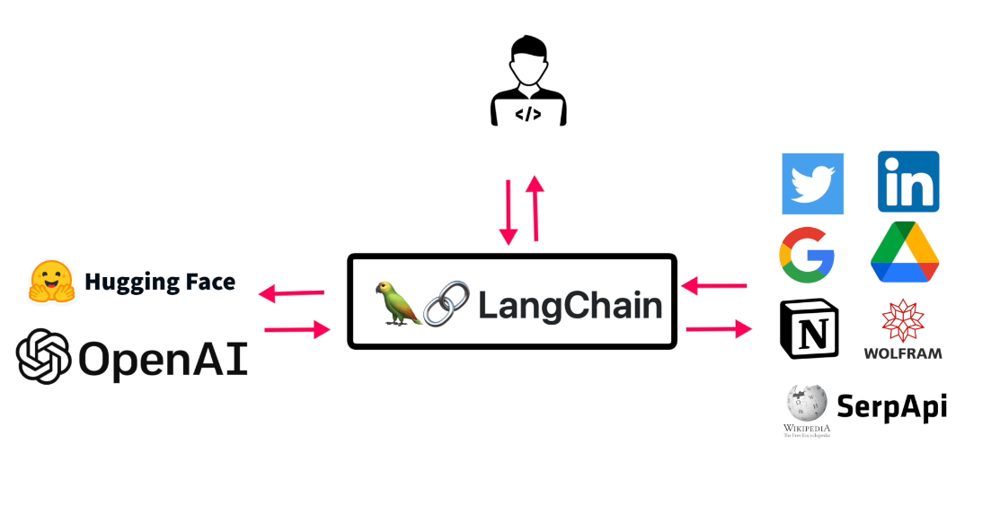






##  text splitters.


Basically, when we want to deal with long pieces of text, it's necessary to split it up to chunks.
So it may sound simple to chunk it up.
But there is a lot of complexity when it comes to this, because there are a lot of different files
and there are a lot of different approaches, and we want to keep everything semantically related.

So basically the text splitter will help us split the text into chunks.
And if we want to comprise it later, it will help us to reassemble it together.

So this is very, very useful when we're trying to resolve that token limit because we can split our


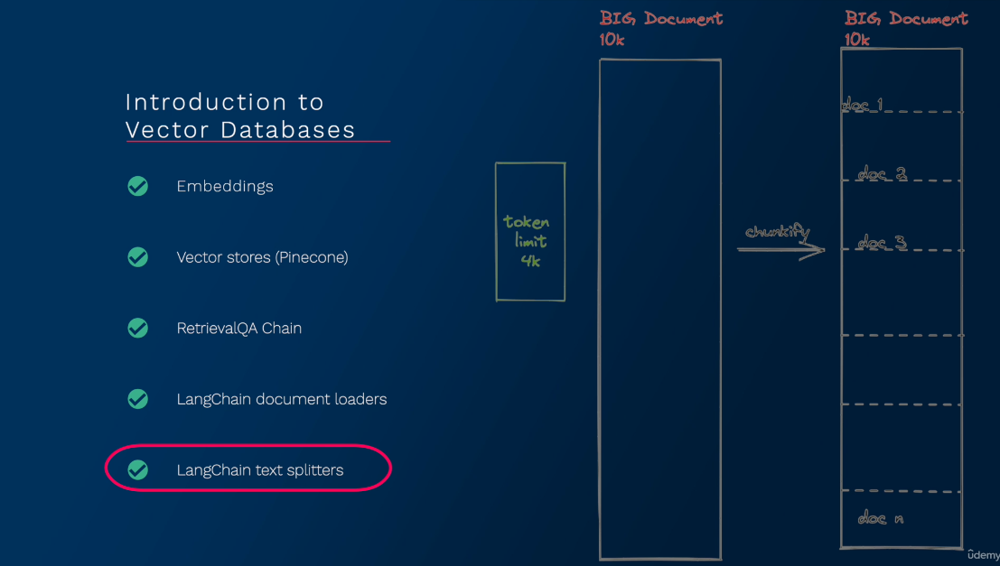




## RAG

So this is very, very useful when we're trying to resolve that token limit because we can split our
text to smaller parts.
And then we have some kind of strategies to get around this token limit, but still process that large
amount of data that we want.

So now I want to show you a cool way of solving this in a very, very elegant solution.

The formal name for this method is called retrieval augmentation generation or in short, Rag.
And the gist of it is that we're taking our original prompt, augmenting it with some relevant context.

And that way the LLM is able to answer the original query when it has the correct context, and we'll
even implement this ourselves end to end in this session.


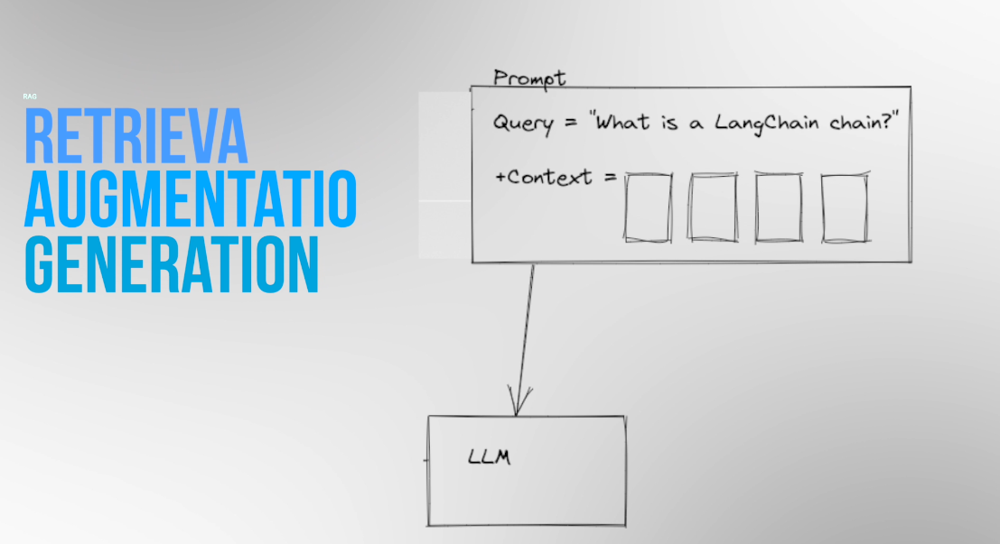




# How to get the Related chunks ? first bad away 

Let's say we have a huge file like a couple of gigs that we want our LLM to process, and we want it
to give us answers about.

For example, let's say it's a book and we want to ask questions about this book 

And let's say that the question that we want to answer, the answer for it resides in a specific part
in the book or over a couple of parts.
But it's very narrow down and it's in very specific places.

So even if we split up the book into lots of chunks and we'll take one chunk or 2 or 3 chunks together
and send them as a context to the LLM to answer the question, then we'll make a lot of redundant API

calls, because the information for our answer is only in specific kind of chunks.

And if we have five chunks, it's okay.But what about if we have 1 million chunks?
But what about if we have 1 million chunks?
So if we have 1 million chunks, we'll make a lot of redundant API calls, which will cost us a lot money 

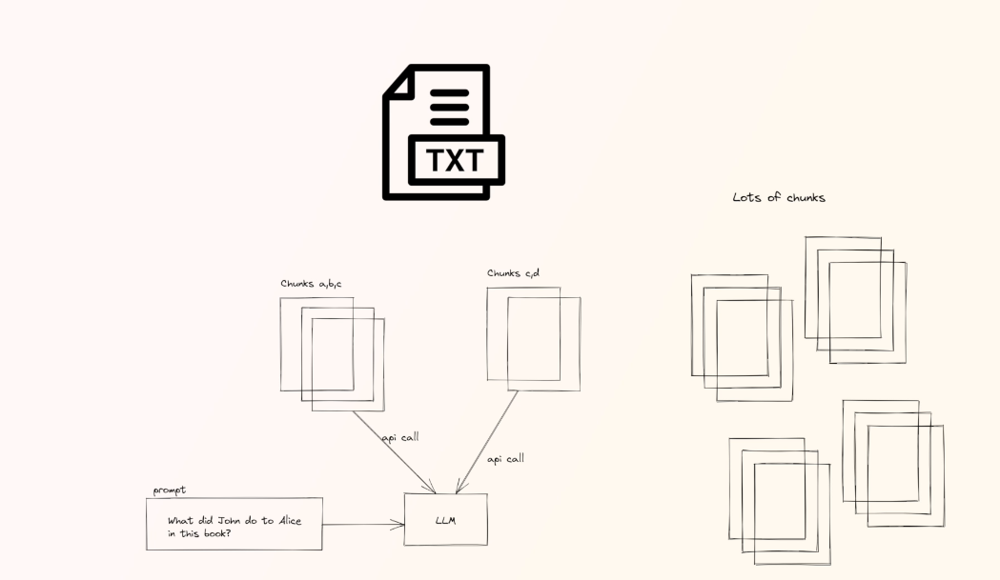




## So what if there was a way to get The relevant chunks ?

The relevant chunks that we need that contain the answer, or have a high probability of containing       

the answer and only sending those chunks to the LLM.            
So that way we only make a couple of API calls or even one, and we save a lot of money and we get the       
response a lot faster and we're not doing any redundant work.         


response a lot faster and we're not doing any redundant work.     

So if that was possible to get those relevant chunks then that would be amazing.          
It would save a lot of time, a lot of effort and a lot of resources and a lot of money.           

Luckily for us, there is a way to do it.             
It's elegant and called retrieval.Augmentation.         

## Now it's time to introduce embeddings.
Basically, text embedding is a classic technique, quite old, but super super useful in the natural
language processing world.

The idea is to create a vector space from the text, such that the distance between the vectors in the
space have a certain meaning.

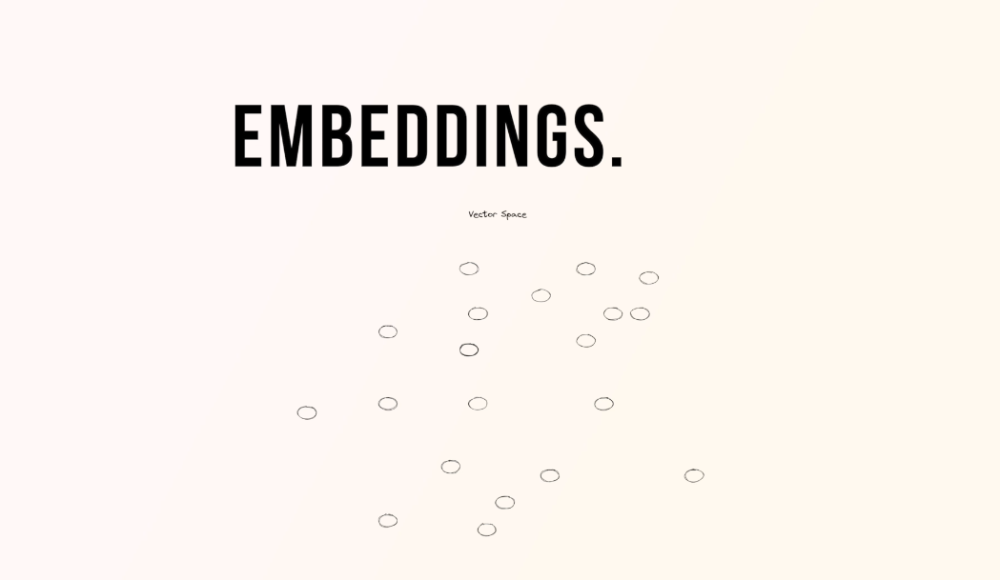


But wait, what's a vector?
A vector is simply a sequence of numbers.

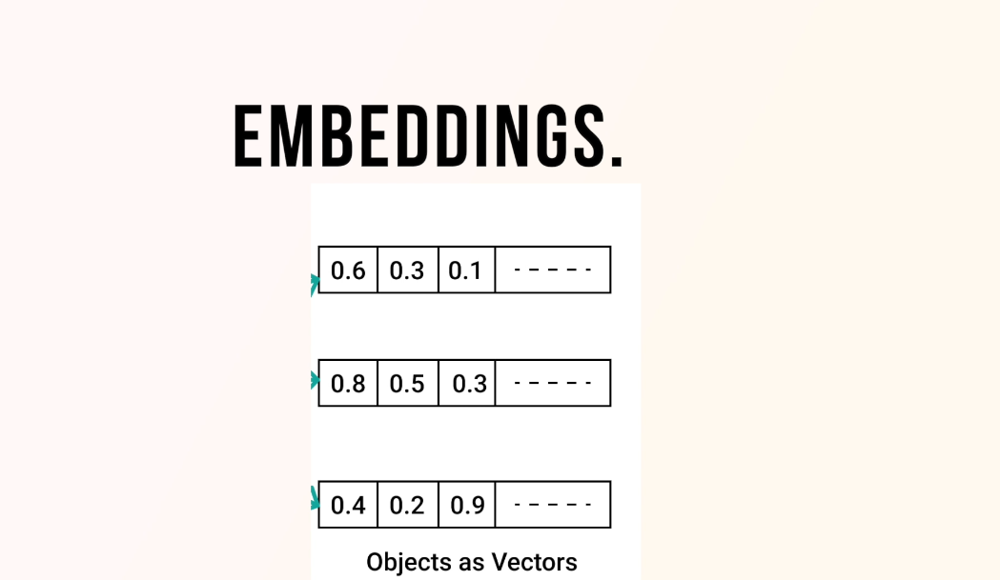

But what's cool about a vector is that it can represent a more complex object like words, sentences,           
images, audio files in a `continuous high dimensional` space called an embedding.            



Now, an embedding model you can think of as a black box which receives objects and those are represented          
by text does some things to them that outputs them.             
This array of numbers, which represents those objects in the vector space, as far as it concerns us,          


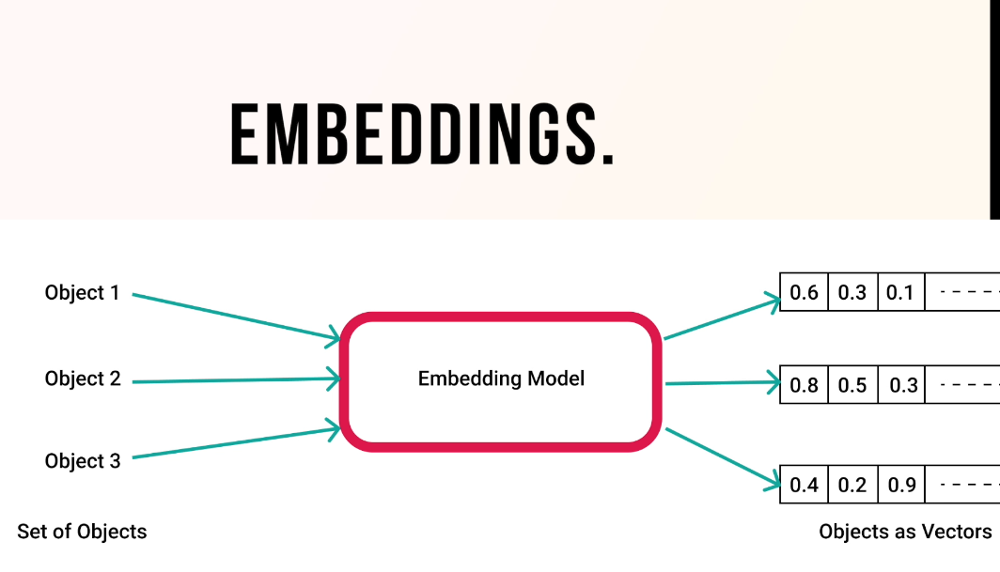



we don't care about what happens in the embedding model.          

All we care about is that text comes in, vectors come out now in good embedding models, takes text            
which has similar semantic meaning, and the representing vectors in the vector space are very, very       
close together.       

You can calculate the distance between each vector to another vector.          

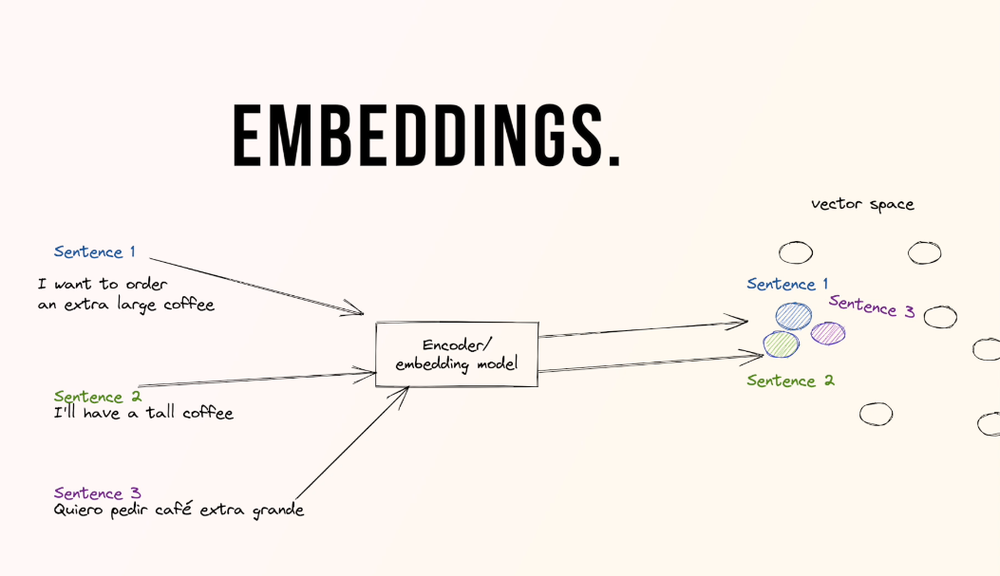

Okay, so like in this example, if I have sentence one, which is I want to order an extra large coffee,     
I have sentence two. 
I'll have a tall coffee and I have sentence three quiero pedir cafe extra grande.

Then in a good embedding, the vectors representing those sentences will be close together in the vector
space or embedding space.

` Now it doesn't even matter that those sentences are even not in the same language, because the semantic `
meaning here is pretty much the same.

So in their vectors representing them, they'll have a small distance between each other.

Now how do we calculate the distance between the vectors.
It's possible and it's basic math, but it's really, really boring and we don't care about it.


## Really  example 

Now let's take another example that is going to bring us closer to the solution to the problem that          
we introduced in the beginning of the section .      

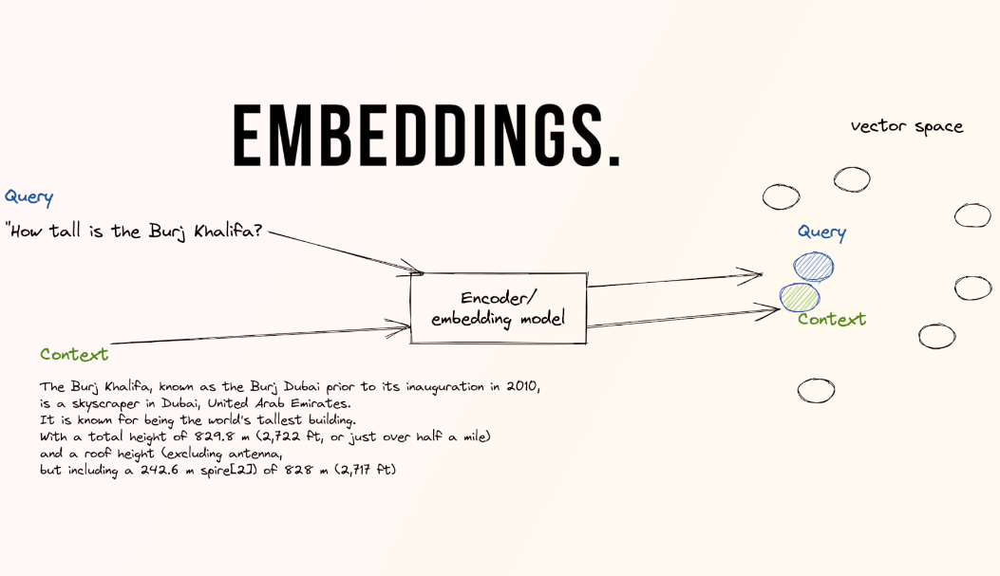


So we have the text how tall is the Burj Khalifa?                
Now the text below is simply a copy paste of the text in Wikipedia describing the Burj Khalifa.        


Now in a good embedding model.         
Then if we embed both of those texts, then there will be very similar together in the vector space,       
their vectors representing them.            


So let's recap a bit about the relevant chunk thingy.       

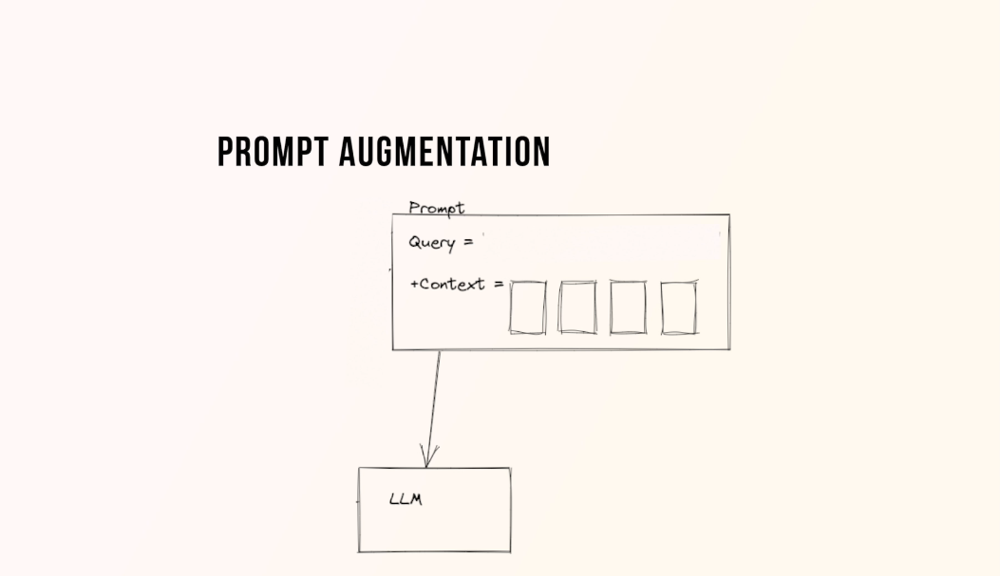


So let's assume for this example that the LLM doesn't really know what is the Burj Khalifa.         
So this information is not available for it and it can't really go online and look for it.           
However, if by somehow we are able to get these relevant chunks of data and we'll do that by simply          
searching for the vector similar to the query we asked, and it's very easy to do.      



So if we have that, we can simply tell it to the LM.         
Hey, I want to know, how tall is the Burj Khalifa?            
Here is some information that is going to help you.          
Please use this information and answer my question.           
Then the LM will have no problem of answering how tall is the Burj Khalifa?              




## Recap 


 create vectors  or representation 

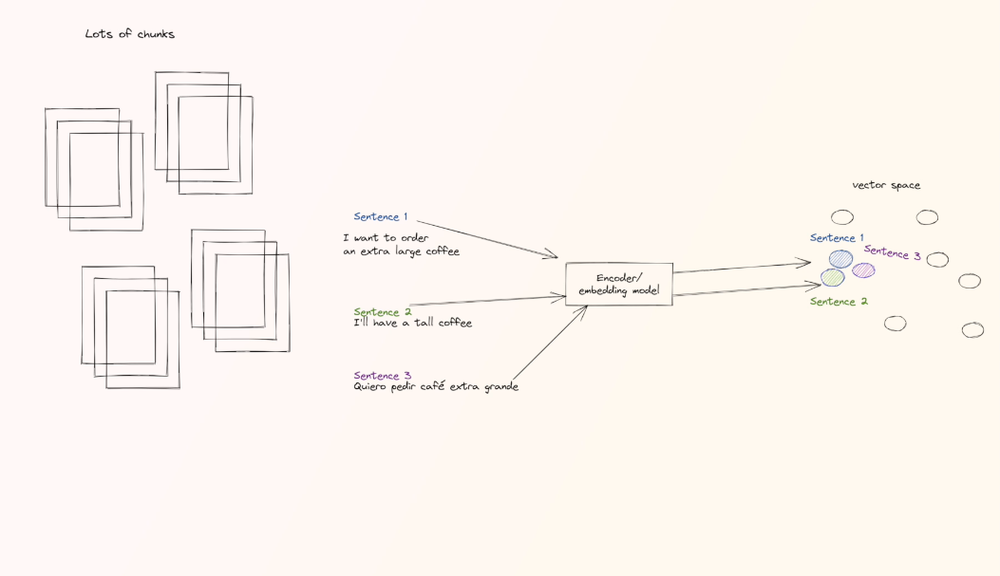


Now we can take those embeddings Settings and save them into a vector database like pinecone, for example.


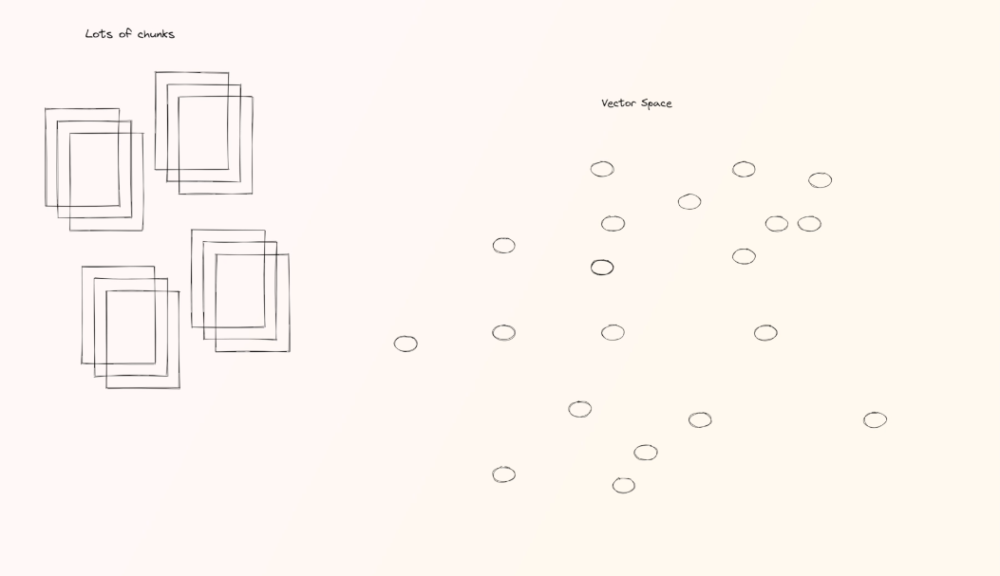


Now, if you want to ask a question about the book, we can take that question as the query, embed
it into a vector, place it into the vector space where all the embeddings of the book of the chunks
And now we can calculate what are the closest vectors to the query vector that we embedded.

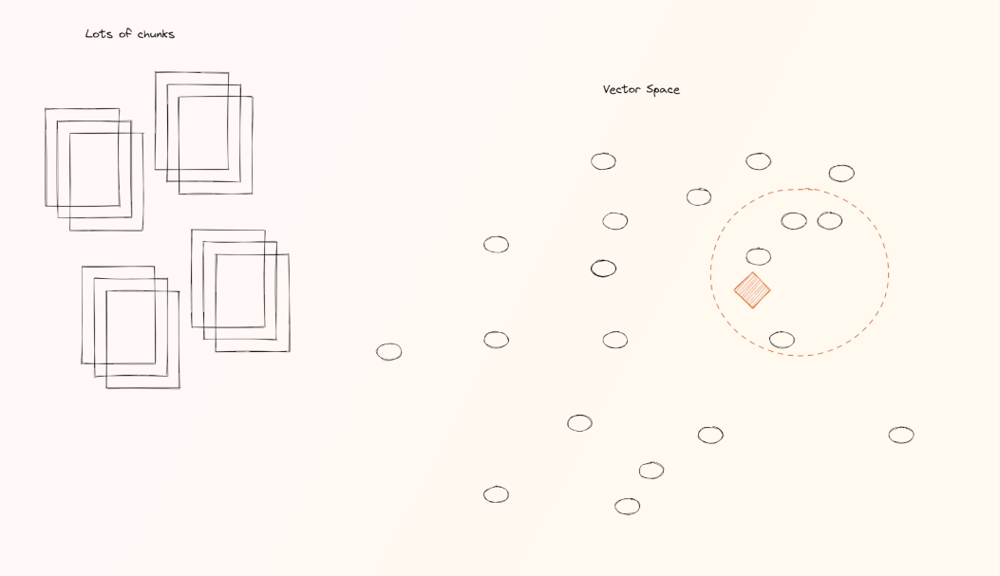

So now we can simply send this context of the relevant chunks with our query in our prompt.

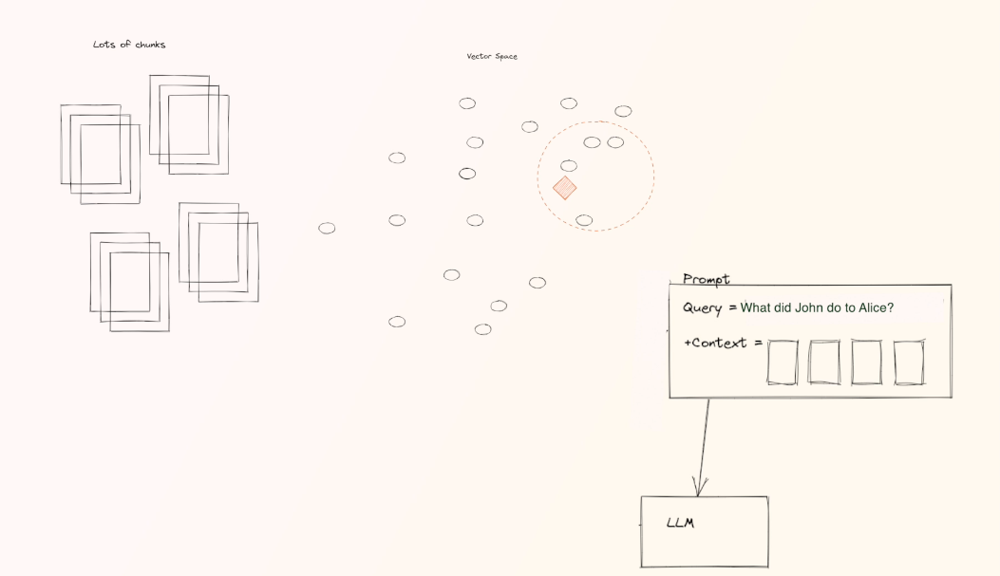

And the final prompt will be what did John do to Alice in the book.
And then we'll send it in the context, the specific chunks that have this answer that have this information.
And then the LLM will be easily able to answer us this question.


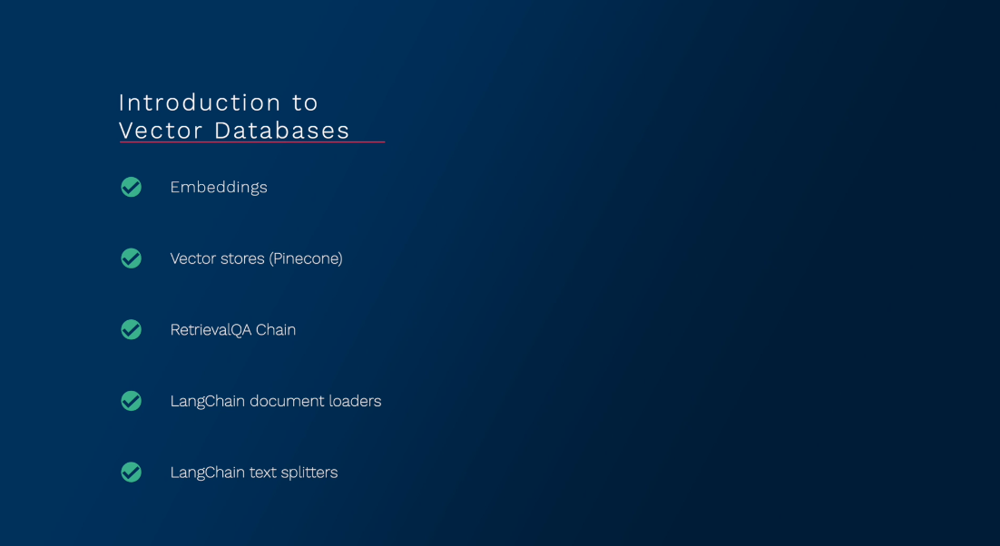



# we are going to be showing an entire RAG pipeline

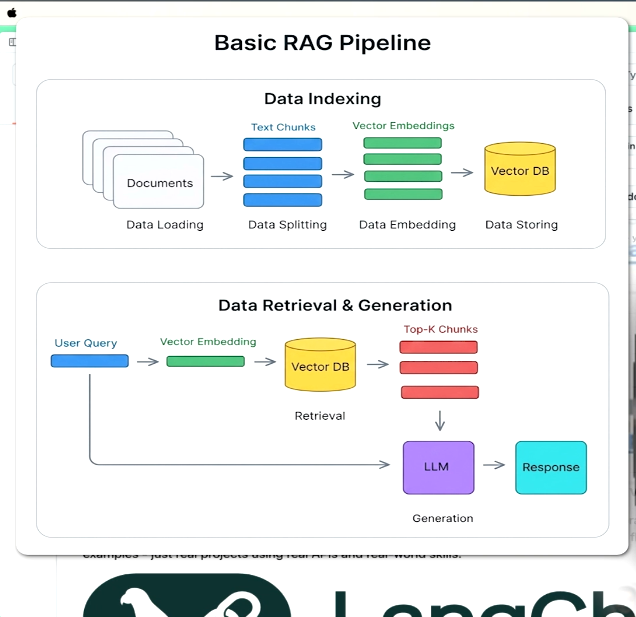




# Setup 



### Signin in pinecone 

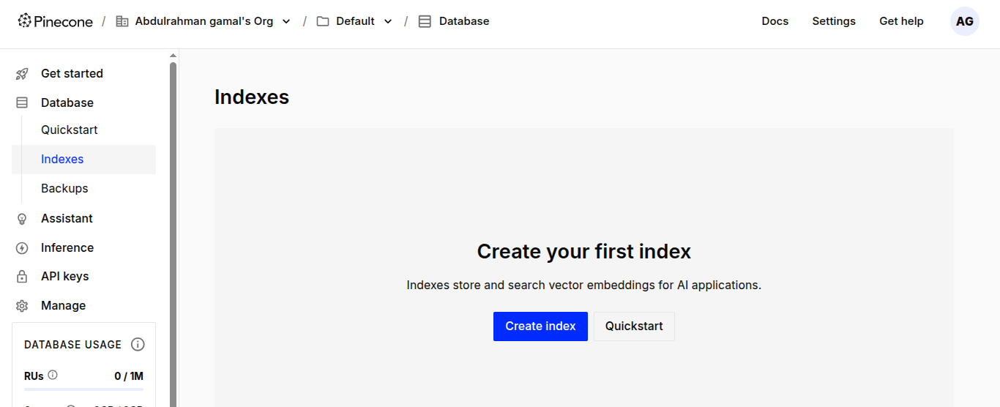

### create index 

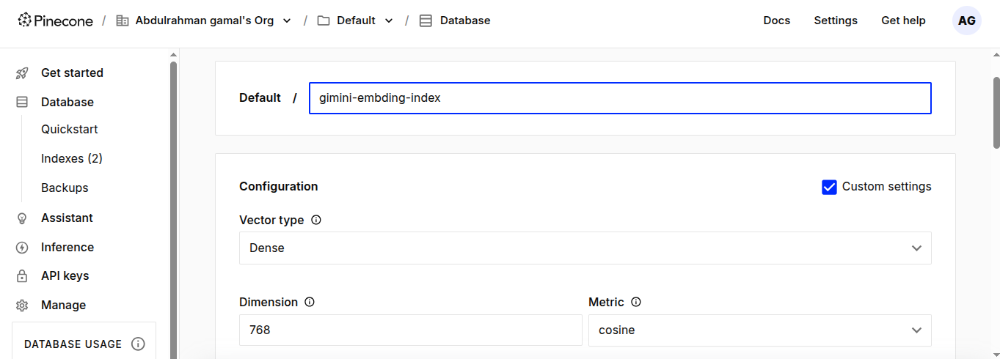

768  is dim for Gemini embedding vectoer

### copy api key 

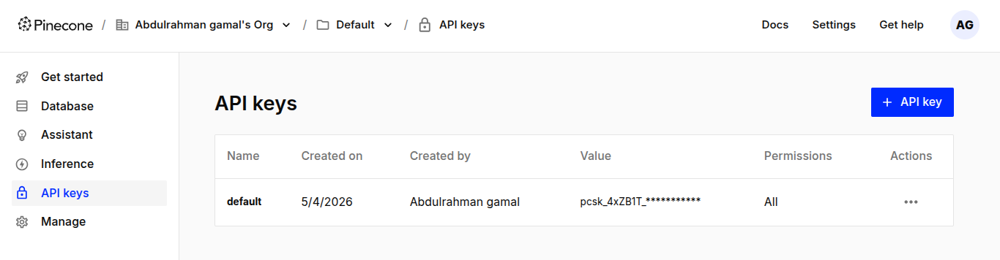


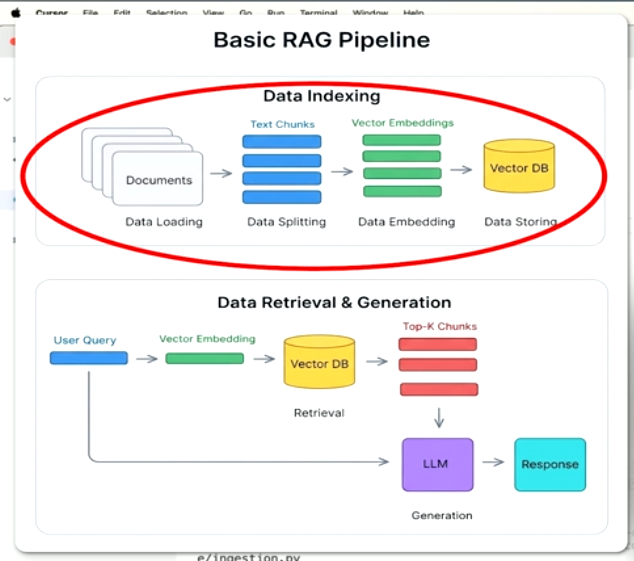

In [ ]:
#So we are going to be using pinecone.
#And Pine Cone is a managed vector store,which is cloud-based.
#open source alternatives and pinecone have a free tier,

! pip install pinecone langchain-pinecone

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.6/587.6 kB 372.9 kB/s  0:00:02eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [langchain-pinecone]angchain-pinecone]


In [7]:
import os
from dotenv import load_dotenv

from langchain_community.document_loaders import TextLoader
from langchain_text_splitters import CharacterTextSplitter

from langchain_google_genai import  GoogleGenerativeAIEmbeddings 
from langchain_pinecone import PineconeVectorStore



## data

So when we talk to LLMs, we send them data and that data is text.      
So the text can be something that we write to the prompt,          

but we can attach to it some other things like           
what if we want to process something on our WhatsApp messages       
or if we want to download some PDF files and process them,        
or if we want to do something with a Notion notebook.         

So all of those elements I described earlier      
are simply text, but they have different formats and different semantic meaning.      

So the `document loaders` are actually classes implementations     
of how to load and process data So to be honest, it's pretty easy to understand.      



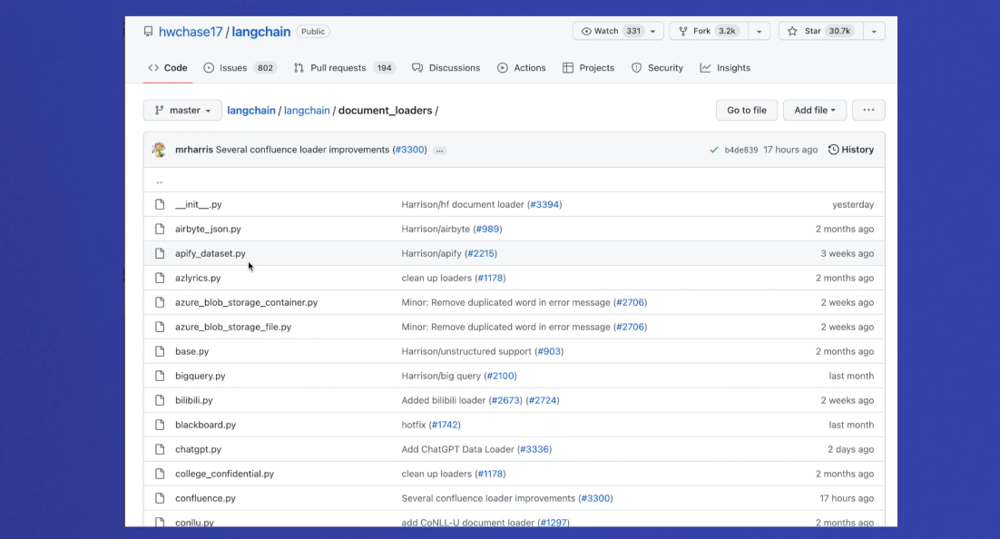

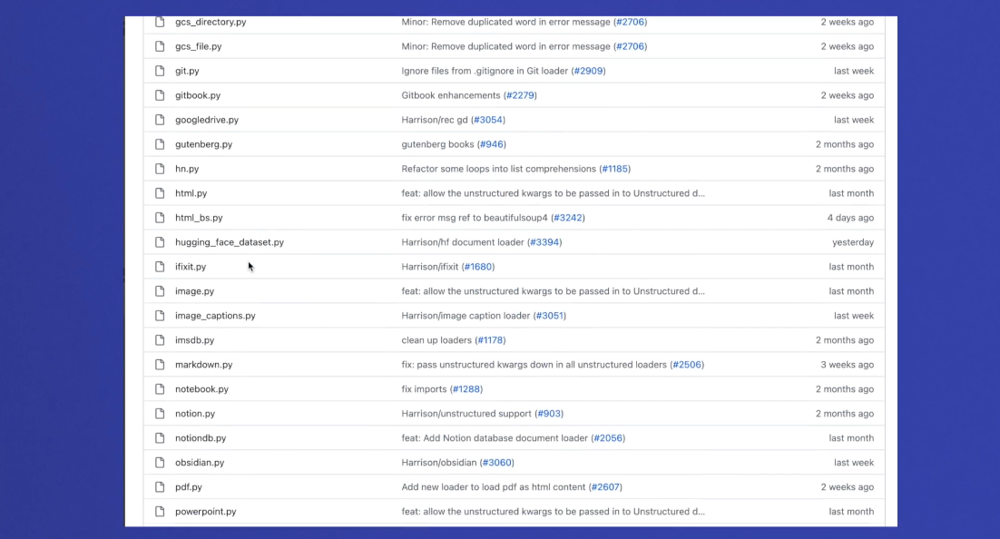

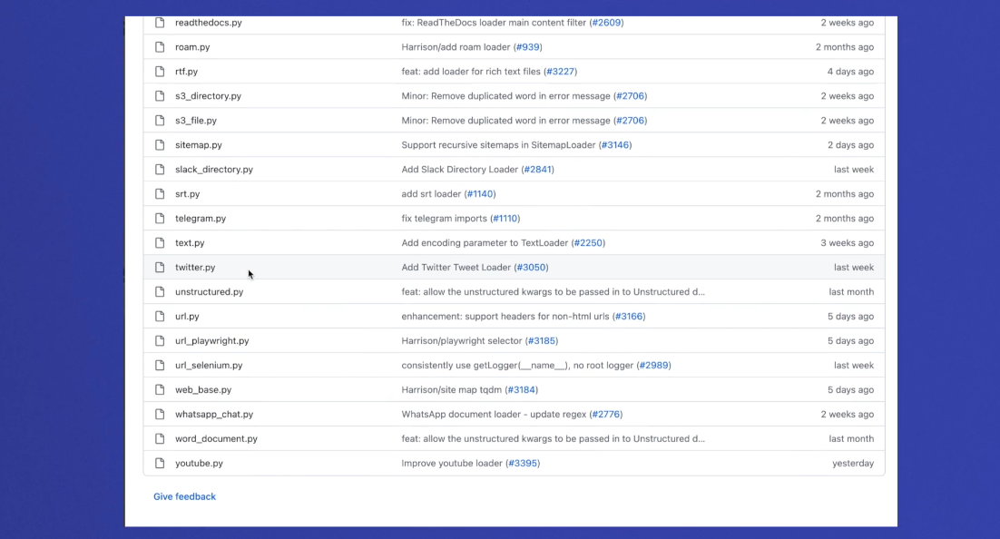



### Code inside  text_loader.py 
So all we're doing right now is simply taking a file path,
opening it up like we would usually open a file in Python,
attaching some metadata that is going to hold the source,
which is going to be equal to the file path of the file.

`So nothing novel here, nothing special.`

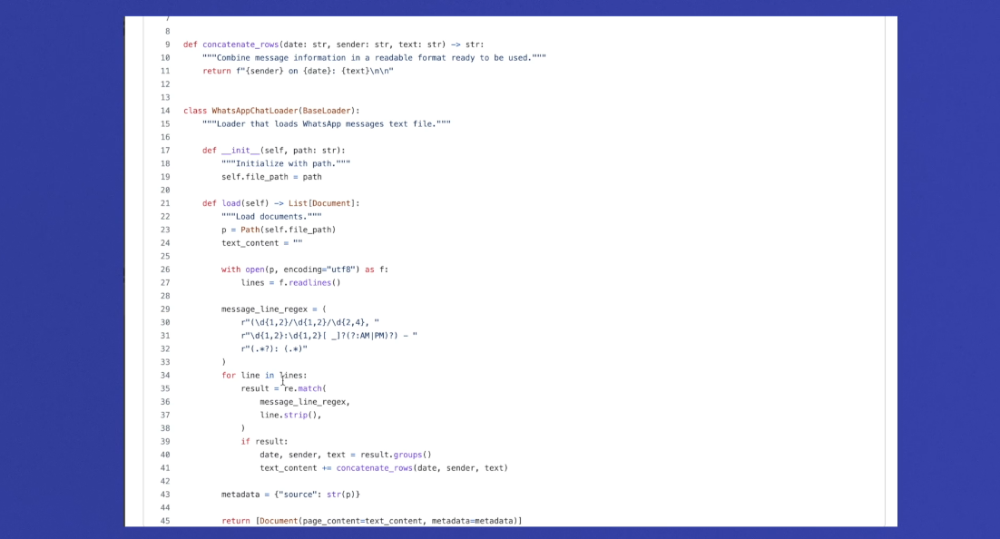

### code inside whatsapp_loader.py 
And all we are doing right now is simply opening up the file like we did with the regular text loader,

then using some regular expressions to extract the names
of the sender, of the receiver, the text,
and the date that it was sent.

And simply concatenate one row after another who sent which row.

So it's simply taking the file, loading it,doing its formatting and returning it as is.

So basically we're making the data more ingestible by the LLM.



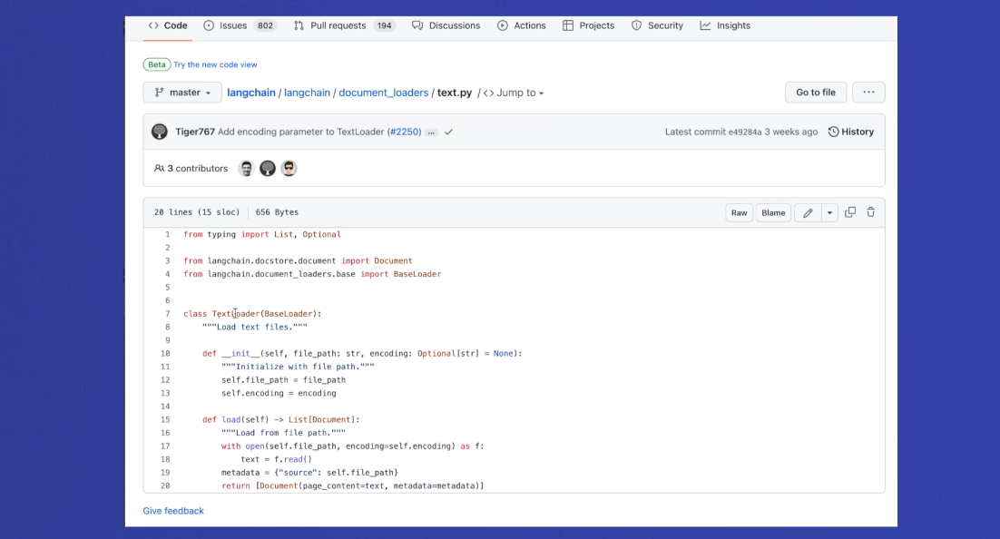

and there are tons of implementations of different file
and document loaders that we can use to our disposal.

So that's what makes LangChain so great

We can handle documents of any kind, of WhatsApp,
of Google Drive, of Notion, of PDF, whatever we want,
LangChain can help the LLM digest it in the best possible way.


## text splitter 
So to conclude, the text splitter
allows us to take text which is large and to split it into chunk.
Now to be honest, text splitters ,because there are a lot of splitting strategies



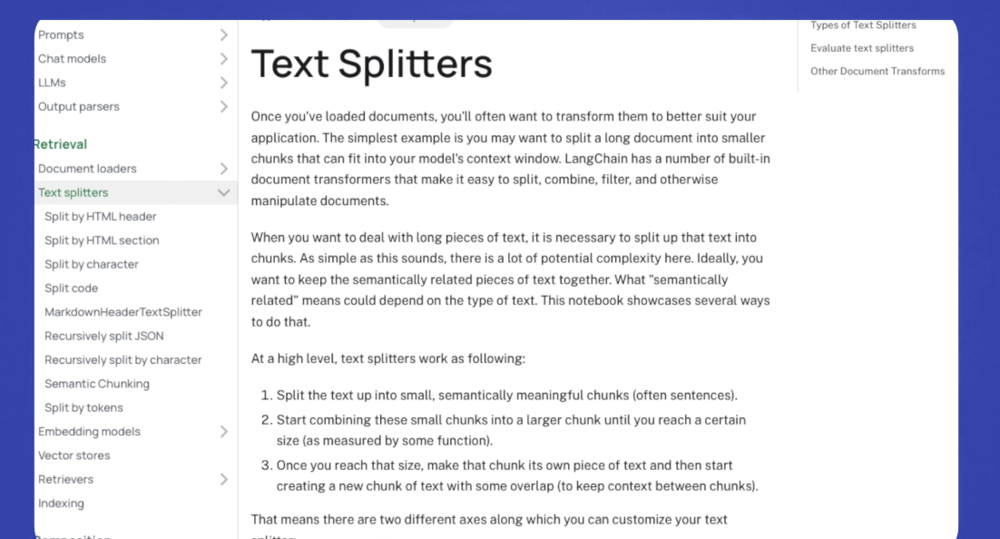



In [ ]:
from  dotenv import load_dotenv
load_dotenv()

print("Ingesting...")
loader = TextLoader("mediumblog1.txt")
document = loader.load()

print("splitting...")
text_splitter = CharacterTextSplitter(chunk_size=1000, chunk_overlap=0)
texts = text_splitter.split_documents(document)

print(f"created {len(texts)} chunks")
embeddings = GoogleGenerativeAIEmbeddings(model="gemini-embedding-001",output_dimensionality=768)


print("ingesting...")
# i commented this out because i dont want to create a new index every time i run the code, but you can uncomment it and run it once to create the index and ingest the data.   
#PineconeVectorStore.from_documents(    texts, embeddings, index_name=os.environ["INDEX_NAME"])
print("finish")



Created a chunk of size 1180, which is longer than the specified 1000
Created a chunk of size 1058, which is longer than the specified 1000


Ingesting...
splitting...
created 20 chunks
ingesting...
finish


### After add vector in Pinecone

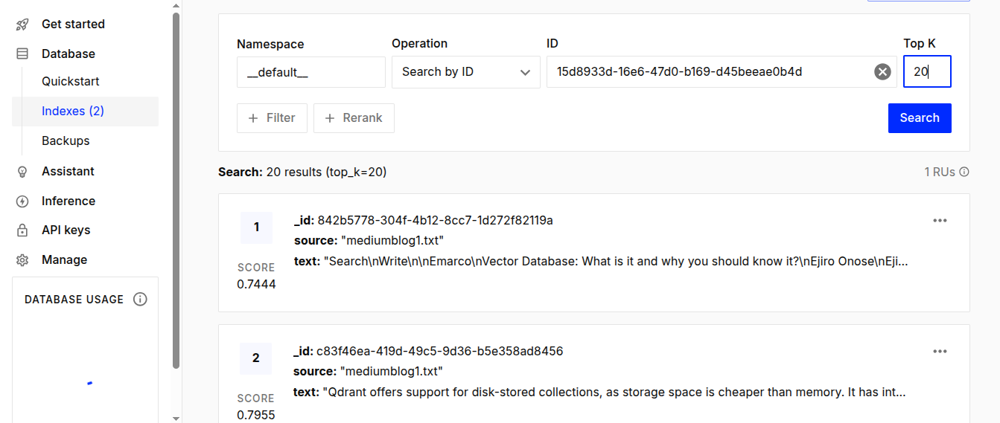

##  Retrieval part 

So in the retrieval part we're going to be taking the user's query.We're going to embed it into a vector.

And then we're going to ask from the vector database to bring us the top k chunks which are the most
similar to our question vector.

So those relevant chunks with the original user query, that's eventually what's going to go to the llms

And this is what's going to generate the answer, which is going to be grounded in the information we


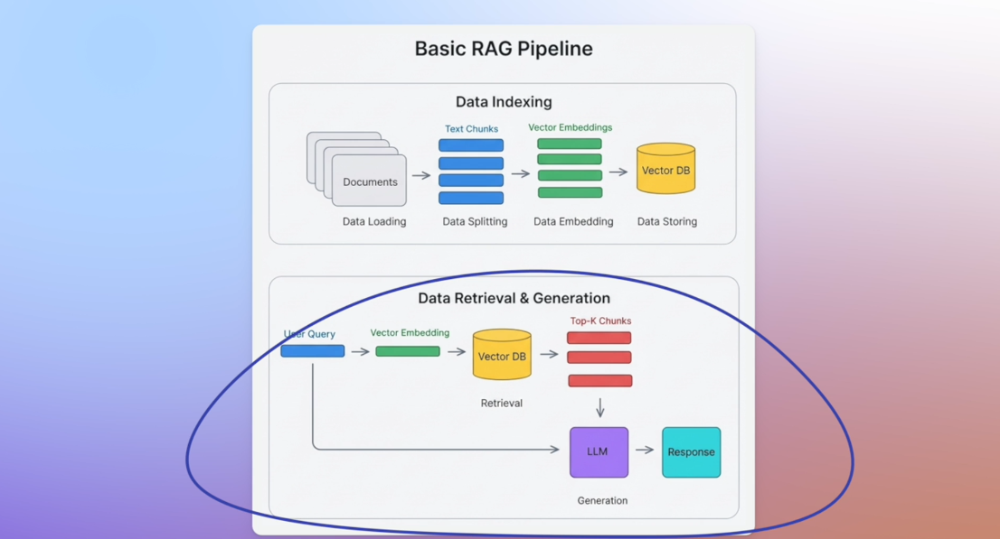

# what we will implement ? 

IMPLEMENTATION 1: Without LCEL (Simple Function-Based Approach)

IMPLEMENTATION 2: With LCEL (LangChain Expression Language) - BETTER APPROACH


In [2]:
import os
from operator import itemgetter

from dotenv import load_dotenv
from langchain_core.messages import HumanMessage
from langchain_core.output_parsers import StrOutputParser
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.runnables import RunnablePassthrough
from langchain_pinecone import PineconeVectorStore
from langchain_google_genai import ChatGoogleGenerativeAI, GoogleGenerativeAIEmbeddings 



/home/abdulrahmangamal/miniconda3/envs/my_jupyter_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
load_dotenv()

print("Initializing components...")

embeddings = GoogleGenerativeAIEmbeddings(
    model="gemini-embedding-001",
    output_dimensionality=768  
)

llm = ChatGoogleGenerativeAI(model="gemini-2.0-flash")


vectorstore = PineconeVectorStore(
    index_name=os.environ["INDEX_NAME"], embedding=embeddings
)
# return object have search capability
retriever = vectorstore.as_retriever(search_kwargs={"k": 3})

prompt_template = ChatPromptTemplate.from_template(
    """Answer the question based only on the following context:

{context}

Question: {question}

Provide a detailed answer:"""
)


def format_docs(docs):
    """Format retrieved documents into a single string."""
    return "\n\n".join(doc.page_content for doc in docs)


Initializing components...


### IMPLEMENTATION 1: Without LCEL (Simple Function-Based Approach)


In [4]:
def retrieval_chain_without_lcel(query: str):
    """
    Simple retrieval chain without LCEL.
    Manually retrieves documents, formats them, and generates a response.

    Limitations:
    - Manual step-by-step execution
    - No built-in streaming support
    - No async support without additional code
    - Harder to compose with other chains
    - More verbose and error-prone
    """
    # Step 1: Retrieve relevant documents
    docs = retriever.invoke(query)

    # Step 2: Format documents into context string
    context = format_docs(docs)

    # Step 3: Format the prompt with context and question
    messages = prompt_template.format_messages(context=context, question=query)

    # Step 4: Invoke LLM with the formatted messages
    response = llm.invoke(messages)

    # Step 5: Return the content
    return response.content


In [9]:
# run  

print("\n" + "=" * 70)
print("IMPLEMENTATION 1: Without LCEL")
print("=" * 70)
result_without_lcel = retrieval_chain_without_lcel(query)
print("\nAnswer:")
print(result_without_lcel)


IMPLEMENTATION 1: Without LCEL


ChatGoogleGenerativeAIError: Error calling model 'gemini-2.0-flash' (RESOURCE_EXHAUSTED): 429 RESOURCE_EXHAUSTED. {'error': {'code': 429, 'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, head to: https://ai.google.dev/gemini-api/docs/rate-limits. To monitor your current usage, head to: https://ai.dev/rate-limit. \n* Quota exceeded for metric: generativelanguage.googleapis.com/generate_content_free_tier_requests, limit: 0, model: gemini-2.0-flash\n* Quota exceeded for metric: generativelanguage.googleapis.com/generate_content_free_tier_requests, limit: 0, model: gemini-2.0-flash\n* Quota exceeded for metric: generativelanguage.googleapis.com/generate_content_free_tier_input_token_count, limit: 0, model: gemini-2.0-flash\nPlease retry in 28.715876243s.', 'status': 'RESOURCE_EXHAUSTED', 'details': [{'@type': 'type.googleapis.com/google.rpc.Help', 'links': [{'description': 'Learn more about Gemini API quotas', 'url': 'https://ai.google.dev/gemini-api/docs/rate-limits'}]}, {'@type': 'type.googleapis.com/google.rpc.QuotaFailure', 'violations': [{'quotaMetric': 'generativelanguage.googleapis.com/generate_content_free_tier_requests', 'quotaId': 'GenerateRequestsPerDayPerProjectPerModel-FreeTier', 'quotaDimensions': {'location': 'global', 'model': 'gemini-2.0-flash'}}, {'quotaMetric': 'generativelanguage.googleapis.com/generate_content_free_tier_requests', 'quotaId': 'GenerateRequestsPerMinutePerProjectPerModel-FreeTier', 'quotaDimensions': {'model': 'gemini-2.0-flash', 'location': 'global'}}, {'quotaMetric': 'generativelanguage.googleapis.com/generate_content_free_tier_input_token_count', 'quotaId': 'GenerateContentInputTokensPerModelPerMinute-FreeTier', 'quotaDimensions': {'model': 'gemini-2.0-flash', 'location': 'global'}}]}, {'@type': 'type.googleapis.com/google.rpc.RetryInfo', 'retryDelay': '28s'}]}}

## tracing  doc 

we have 3 doc 

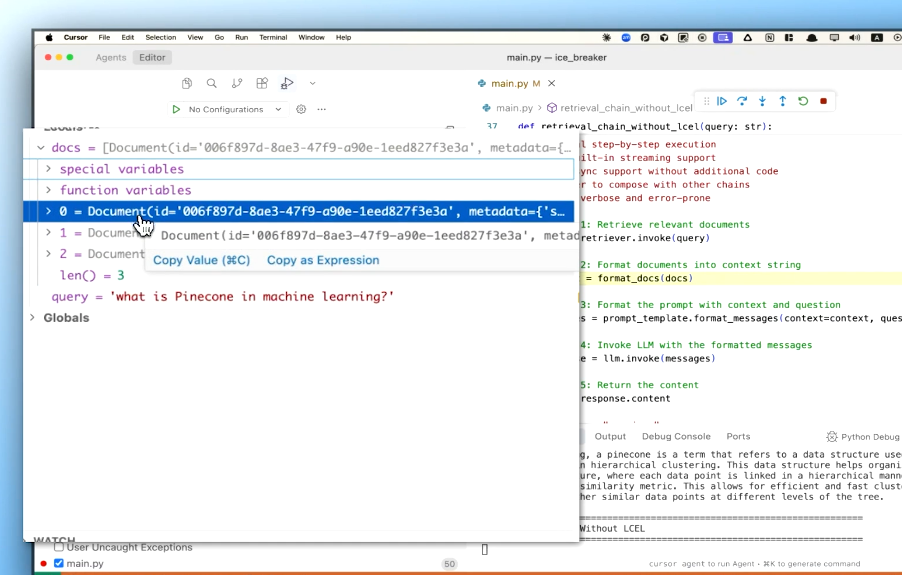


each doc have 


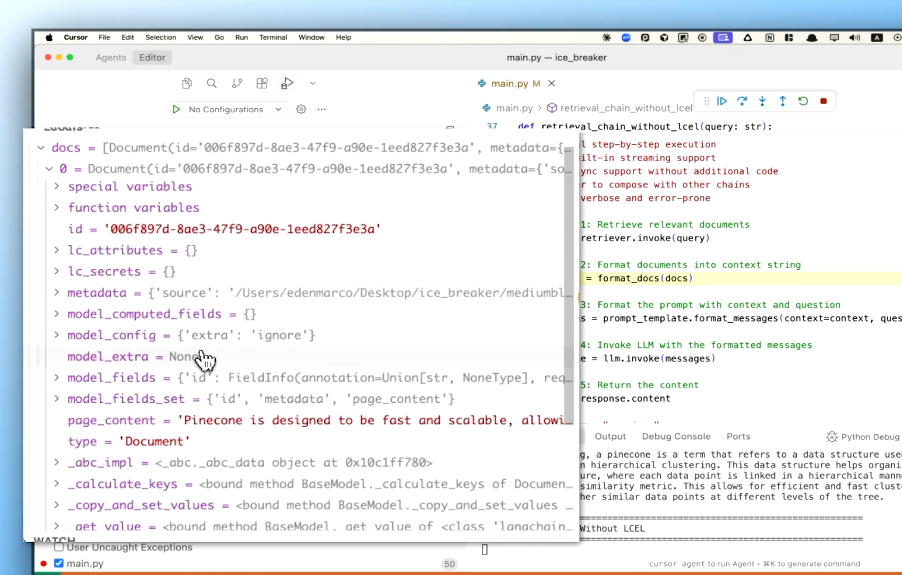


Now we want to take those documents and now we want to format them as strings.



## tracing context 

make three doc as string 

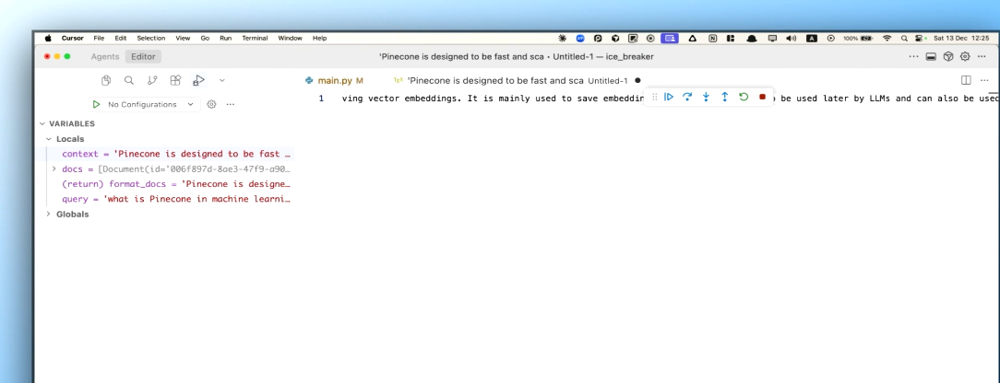



### IMPLEMENTATION 2: With LCEL (LangChain Expression Language) - BETTER APPROACH


In [ ]:
def create_retrieval_chain_with_lcel():
    """
    Create a retrieval chain using LCEL (LangChain Expression Language).
    Returns a chain that can be invoked with {"question": "..."}

    Advantages over non-LCEL approach:
    - Declarative and composable: Easy to chain operations with pipe operator (|)
    - Built-in streaming: chain.stream() works out of the box
    - Built-in async: chain.ainvoke() and chain.astream() available
    - Batch processing: chain.batch() for multiple inputs
    - Type safety: Better integration with LangChain's type system
    - Less code: More concise and readable
    - Reusable: Chain can be saved, shared, and composed with other chains
    - Better debugging: LangChain provides better observability tools
    
    But I think the most important advantage is that we get much better observability with lamb-smith.

    """
    
    retrieval_chain = (
        RunnablePassthrough.assign(
            context=itemgetter("question") | retriever | format_docs
        )
        | prompt_template
        | llm
        | StrOutputParser()
    )
    return retrieval_chain

"""
RunnablePassthrough   
-----------------
can see that this runnable actually behaves almost exactly like the identity function.
So it does not change the input, except that it has the ability to be configured such that we add additional
keys to the output.If the input is a dictionary.

itemgetter
----------
And I want also to import item Gator, which is a Python utility function from the operator module that
creates a callable object to fetch items from an object using indexing, we can actually use lambda
functions to do so, but it's more convenient to do it with item gator.

create_retrieval_chain_with_lcel
-------------------------
And the reason for this is that this function is going to eventually return us a length chain chain.
So the chain is going to be a length chain runnable.
So this is why this function does not receive any input.
The input to the chain is going to be the input to the invoke function, like we know from previous
 
 
"""

### map new func on old one 

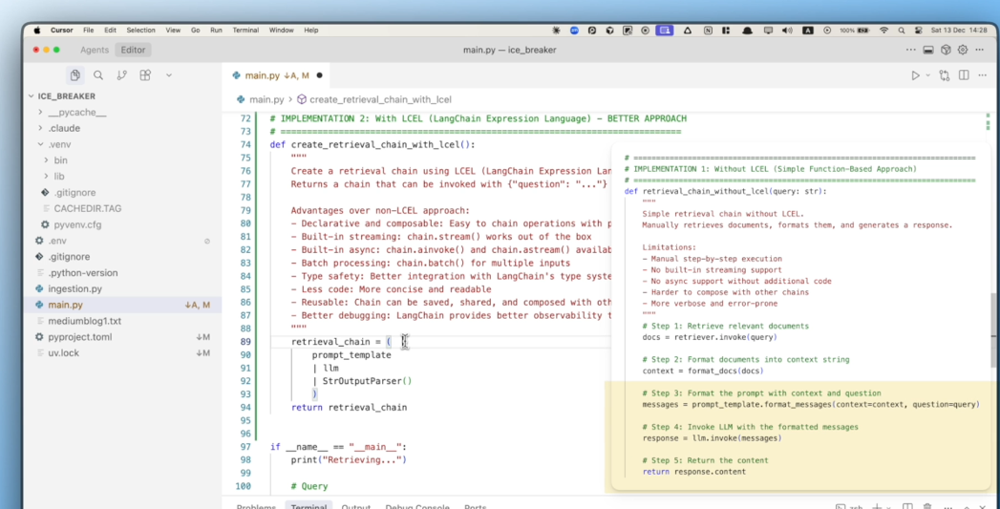


So now the question is how do we get to populate this prompt template with the context field.
And with the question field, just like we did in the naive implementation in steps one, two and three.

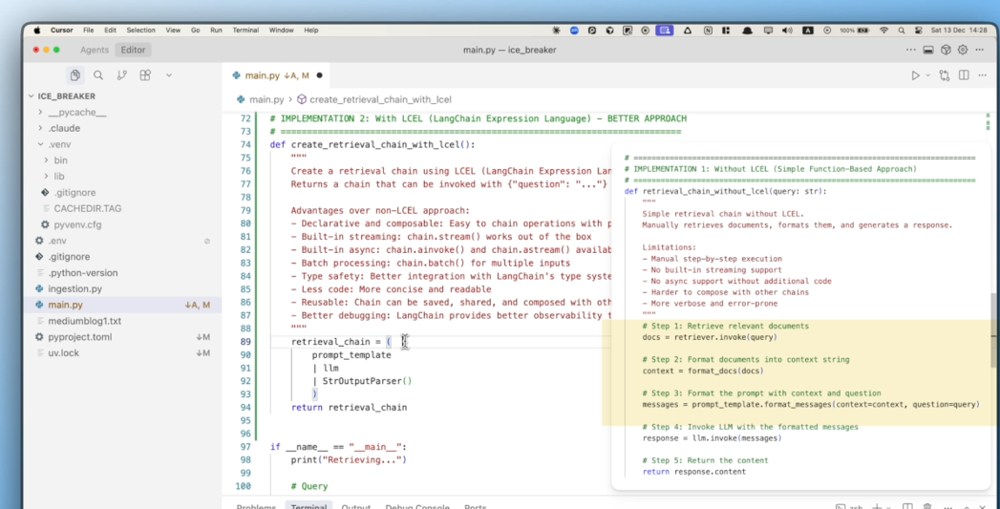


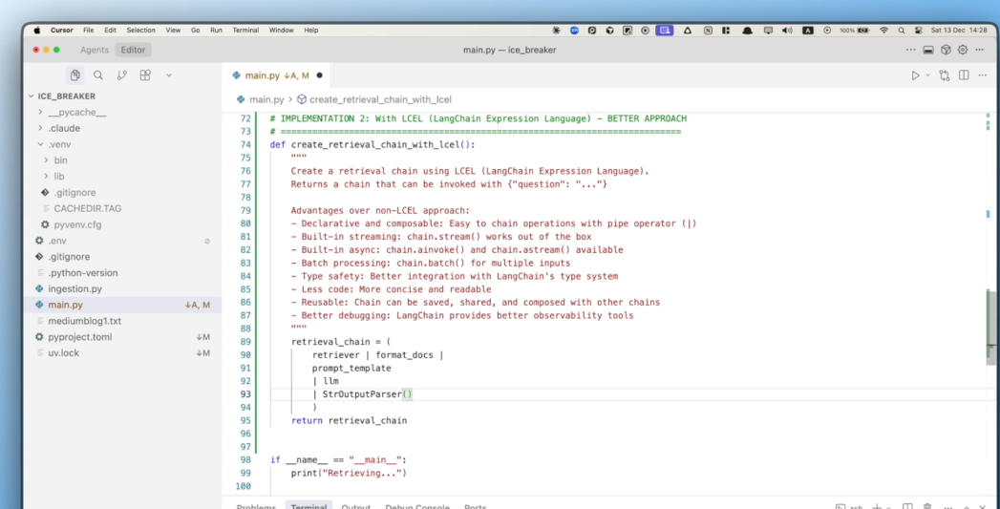



### Some issue 


1- So I remind you, the format docs is a function.         
It's not a long chain runnable.It doesn't have the invoke method.              
But I promise you, we're going to run this and this is going to work.            

Because when we use regular Python functions in a link chain expression language, chain link chain           
automatically converts those regular Python functions into runnable lambdas.         


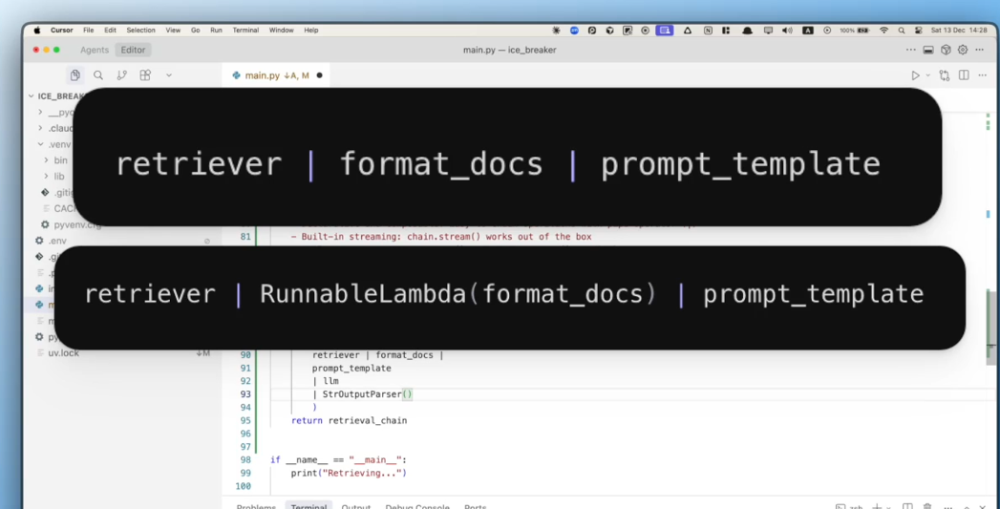 

So when we write something like retrieval pipe format docs, pipe to the prompt template under the hood        
And this runnable lambda is a runnable, and it adheres to the runnable interface.       
We can stream with it, we can batch process with it.           

2- So now we need to solve another issue.          

So the prompt template I remind you it needs to receive two arguments.        
It needs to receive the question of the user.          
And it needs to also receive the context which is a string.        

So right now the output of this part over here is not going to do this for us.         

So we need to find some kind of way to take this output and somehow to attribute it to the key of context.         
So the result of this, which is going to go into the prompt template, is going to be under the context            

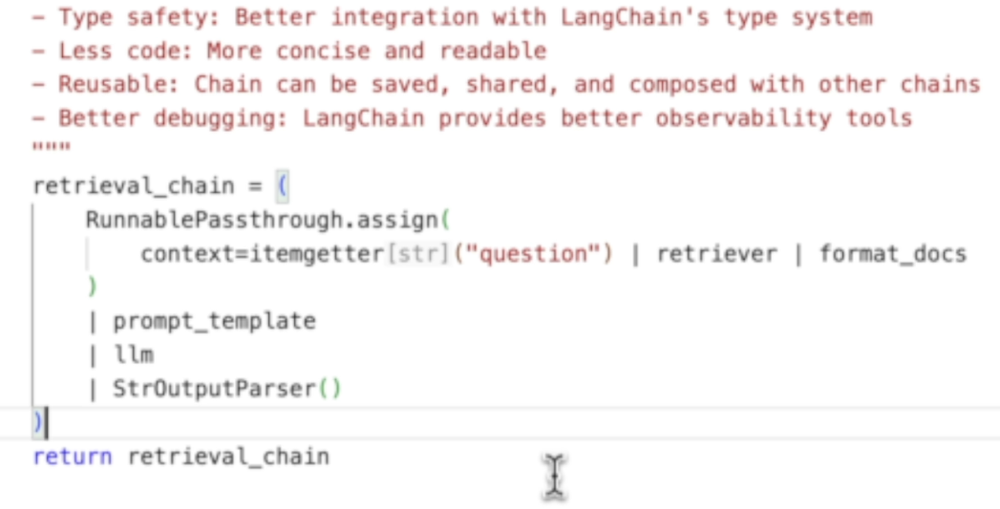

So we are going to take this and we are going to wrap it under a runnable pass through, and we are        
going to use the assign method.           

So the gist of it is that runnable passthrough dot assign creates a new dictionary that is going to      
combine the original input with the new computed field that we're going to explicitly mention.         
And here the input field is going to be the question and what is pinecone.           

So the output of it still is going to have a dictionary of the key question with the value of what is         
pinecone

However, now we want to add to this dictionary new key with the key of context and the value of this        
chain right over here.          


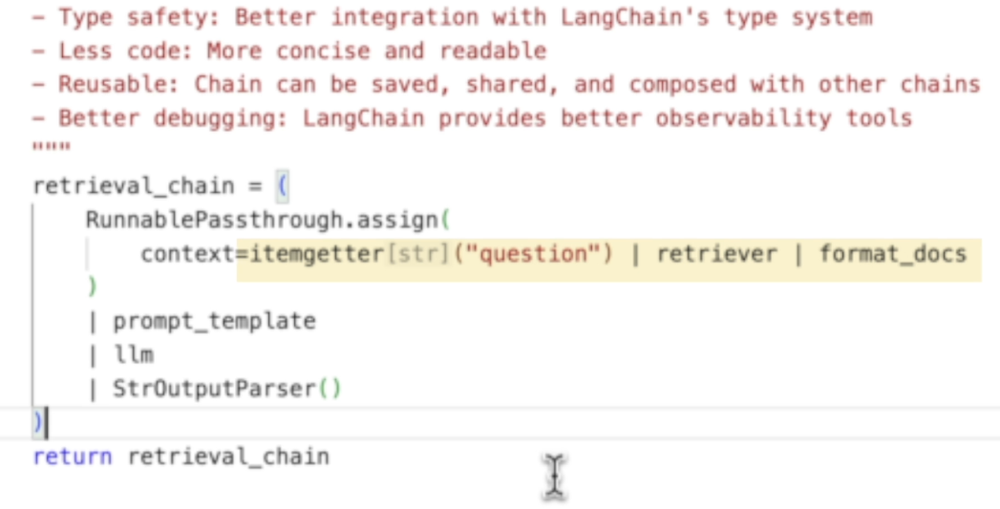  


you can use lambda instead of  itemgetter        

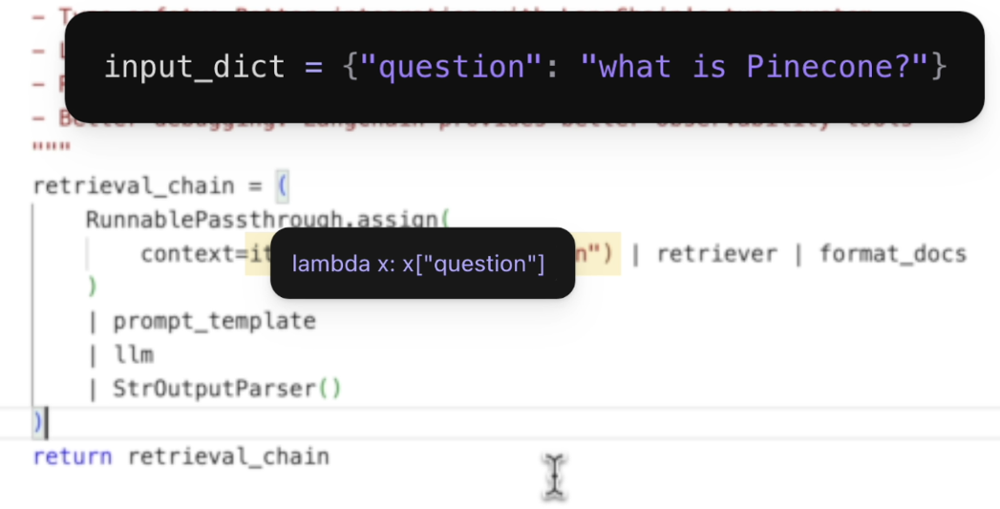



So we see that the first step is wrapped entirely with a runnable passthrough.   
So this means we do not change the input.  
So the result of invoking this is still going to have a dictionary with the key of question.     
And it's going to have this value inside it.        

And because we used the assign method and we gave it a keyword argument of context.    
So this means we are adding now to this output dictionary.                  
Another key.   
And the key is going to be context.   
And the value of the key is going to be this chain running over here.     

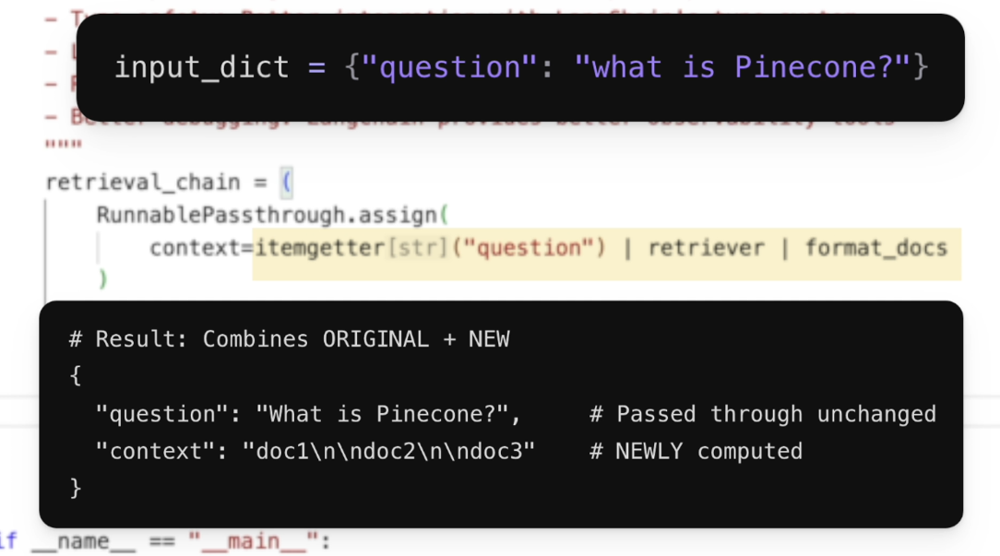



In [ ]:
print("\n" + "=" * 70)
print("IMPLEMENTATION 2: With LCEL - Better Approach")
print("=" * 70)
print("Why LCEL is better:")
print("- More concise and declarative")
print("- Built-in streaming: chain.stream()")
print("- Built-in async: chain.ainvoke()")
print("- Easy to compose with other chains")
print("- Better for production use")
print("=" * 70)


chain_with_lcel = create_retrieval_chain_with_lcel()
result_with_lcel = chain_with_lcel.invoke({"question": query})
print("\nAnswer:")
print(result_with_lcel)



### output  

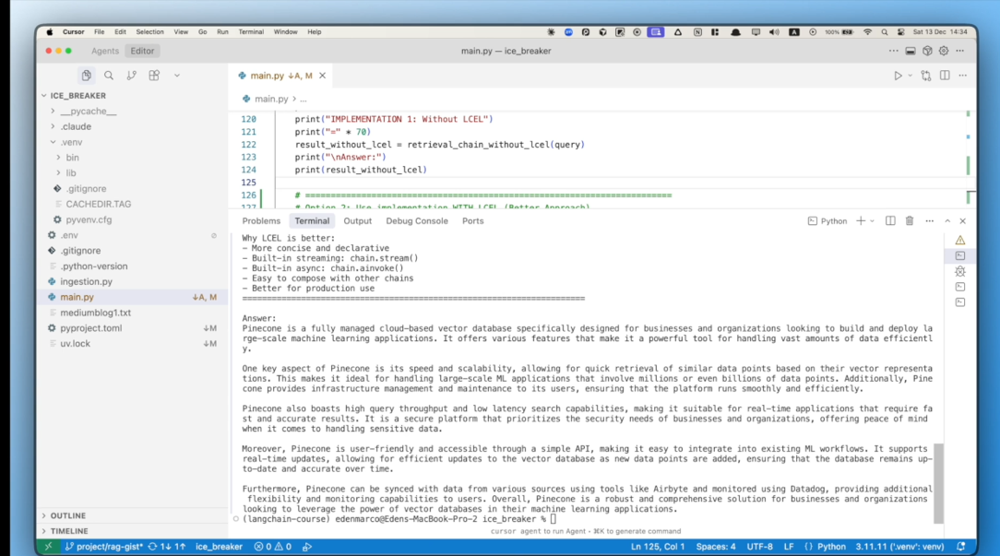


### langsmith tracing all thing under on call  not like first implementation 

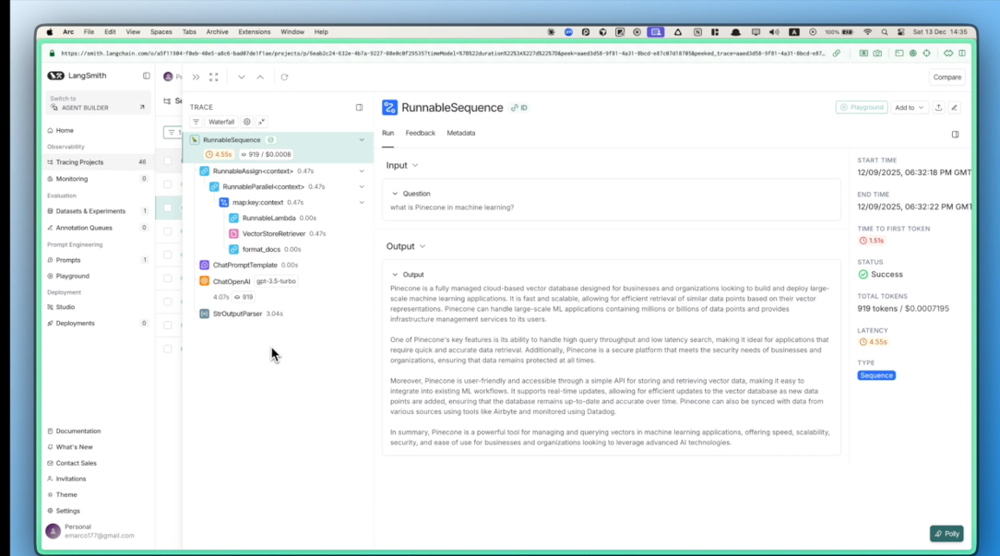




# Next section  
and we're going to be implementing something that's called a documentation helper.

So we're going to plug in the documentation What are we building? A lightweight Cursor/ Feature Feature (RAG)


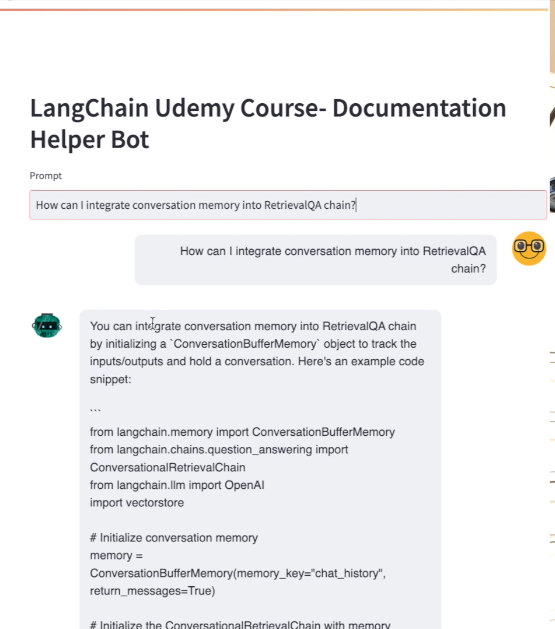

# References  





- course        
https://banquemisr25.udemy.com/course/langchain/learn/lecture/53949869#overview

- vector databases      
https://medium.com/@EjiroOnose/vector-database-what-is-it-and-why-you-should-know-it-ae7e7dca82a4

- code          
https://github.com/emarco177/langchain-course/tree/project/rag-gist  